# 0. Install

* plotly could be omitted

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# ds  specific
import pandas as pd
import numpy as np

# Visuals
import matplotlib.pyplot as plt
import seaborn as sns

# stats
from scipy import stats
from scipy.optimize import fsolve

# ml
from sklearn.model_selection import train_test_split

# system
import pathlib
import sys

In [4]:
# Local modules
sys.path.append(str(pathlib.Path().resolve().parent))

from src.visuals.plot_utils import set_plot_params, save_plot
from src.visuals.plot_statistics import plot_corr_matrix, plot_boxplot, plot_grouped_hists, plot_pairplot, plot_qq_hist_plot, plot_pred_with_intervals
from src.visuals.plot_importances import get_permutation_importance, plot_vert_boxplot #, plot_power_prediciton
from src.visuals.plot_pca import plot_and_get_pca

from src.stats.describe_dataset import display_df_info, get_vif

from src.models.stat_models import create_explore_ols
from src.models.metrics import calculate_metrics
from src.stats.stat_tests import get_hetero_white_test, get_hetero_breusch_pagan
from src.models.functions import ControlFunction

C:\Users\parshin_sa2\Desktop\Desktop\Education\advanced_analytics_process_control\src\models\functions.py:5: SyntaxWarning: invalid escape sequence '\c'
  """


# 1. Constants

Most of constants are placed here. All constants which used in several cells are in CAPITAL format.

General

In [5]:
SEED = 42

Visual

In [6]:
# Matplotlib params
FIGSIZE = (24, 8)
set_plot_params(figsize=FIGSIZE)
BASE_CONTEXT = 'fivethirtyeight'

# Plot
SHOW_ROWS = 600

# See palette
PALETTE = sns.color_palette()
print(PALETTE.as_hex())

IS_SAVE_PLOTS = True
IS_SHOW_PLOTS = True

['#4c72b0', '#dd8452', '#55a868', '#c44e52', '#8172b3', '#937860', '#da8bc3', '#8c8c8c', '#ccb974', '#64b5cd']


Dataframe params

In [7]:
RAW_DATA = pathlib.Path("../data/raw/raw_data.csv")
FIGURES_PATH = pathlib.Path("../reports/figures/")
FIGURES_RAW = pathlib.Path("raw")
FIGURES_PROCESSED = pathlib.Path("processed")

DATA_TYPES = {
    "t5": "int16",
    "t1": "int16",
    "t2": "float16",
    "t3": "int16",
    "t4": "int16",
    "t6": "int16",
    "t7": "int16",
    "t8": "float16",
    "t9": "category", # "int16",
    "t10": "float16",
    "t11": "int16",
    "t12": "int16",
    "t13": "int16",
}
CATEGORICAL_COLS = ["t9",]
NUMERIC_COLS = [col for col in DATA_TYPES.keys() if col not in CATEGORICAL_COLS]

Model params

In [8]:
TARGET = "t5"
IMPORTANCE_TRAIN_TEST_CFG = {
    "test_size": 0.25,
    "shuffle": True,
}
IMPORTANCE_RF_CFG = {
    "min_samples_leaf": 10,
}
TEST_SIZE = 0.1
NORMALITY_TEST =  "Kolmogorov-Smirnov" # "Shapiro-Wilk" also could be, but bad for n>5000, whereas "Kolmogorov-Smirnov" is non-parametric and resistant

# 2. Data exploration and feature engineering

<div class="alert-info">
Because one of the goal is to have an Interpretable model, therefore all transformations are aimed to transform data for it.
</div>

Read data

In [9]:
df_raw_: pd.DataFrame
df_raw_ = pd.read_csv(RAW_DATA, dtype=DATA_TYPES)
df_raw_ = df_raw_[DATA_TYPES.keys()] # type: ignore
df_raw_.sample(5)

,t5,t1,t2,t3,t4,t6,t7,t8,t9,t10,t11,t12,t13
29018,105,60,78.625,119,69,180,119,16.000000,1,1.000000,26,17,12
32016,84,60,75.500,111,77,172,49,14.203125,1,1.000000,19,23,59
52408,100,50,71.000,125,84,170,102,14.703125,1,0.700195,21,13,49
32468,123,75,90.000,136,89,198,90,13.898438,1,0.899902,22,14,29
1923,109,65,76.000,116,74,178,95,15.500000,1,1.099609,24,14,66


Delete dublicates   
Depending of the meaning of duplicates it could be converted into frequency feature.

In [10]:
df_raw = df_raw_.drop_duplicates().reset_index(drop=True)
print(f"Dropped duplicates: "
      f"{100 * (df_raw_.shape[0] - df_raw.shape[0]) / df_raw_.shape[0]:.2f} %")

Dropped duplicates: 20.00 %


### Explore data structure, nulls and basic statistics

In [11]:
display_df_info(df_raw)
display(df_raw[CATEGORICAL_COLS[0]].describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44552 entries, 0 to 44551
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   t5      44552 non-null  int16   
 1   t1      44552 non-null  int16   
 2   t2      44552 non-null  float16 
 3   t3      44552 non-null  int16   
 4   t4      44552 non-null  int16   
 5   t6      44552 non-null  int16   
 6   t7      44552 non-null  int16   
 7   t8      44552 non-null  float16 
 8   t9      44552 non-null  category
 9   t10     44552 non-null  float16 
 10  t11     44552 non-null  int16   
 11  t12     44552 non-null  int16   
 12  t13     44552 non-null  int16   
dtypes: category(1), float16(3), int16(9)
memory usage: 1.1 MB


None

c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


,t5,t1,t2,t3,t4,t6,t7,t8,t10,t11,t12,t13
count,44552.000000,44552.000000,44552.00000,44552.000000,44552.000000,44552.000000,44552.000000,4.455200e+04,44552.000000,44552.000000,44552.000000,44552.000000
mean,99.320210,65.883462,inf,121.529179,76.043320,196.996005,126.722257,inf,0.885742,26.213795,27.085002,40.066103
std,20.845547,12.823819,9.28125,13.688876,9.695356,36.423237,71.612721,1.565430e+00,0.226074,19.087304,31.755110,50.723940
min,46.000000,30.000000,51.00000,71.000000,40.000000,55.000000,8.000000,4.898438e+00,0.099976,6.000000,1.000000,1.000000
0.2%,66.000000,40.000000,59.00000,89.000000,51.000000,104.000000,27.000000,8.010359e+00,0.399902,11.000000,6.000000,7.000000
1%,73.000000,45.000000,62.50000,92.000000,56.000000,120.000000,34.000000,1.010156e+01,0.500000,13.000000,8.000000,9.000000
5%,80.000000,45.000000,67.00000,100.000000,60.000000,141.000000,46.000000,1.210156e+01,0.600098,15.000000,10.000000,11.000000
50%,96.000000,65.000000,82.00000,120.000000,76.000000,195.000000,108.000000,1.479688e+01,0.899902,23.000000,21.000000,26.000000
95%,130.000000,90.000000,98.00000,144.000000,91.000000,259.000000,277.000000,1.690625e+01,1.200195,45.450000,62.000000,112.000000
99%,188.000000,100.000000,105.50000,159.000000,101.000000,292.000000,361.000000,1.770312e+01,1.299805,80.000000,111.000000,244.000000


NaNs portion: 0.000


count     44552
unique        6
top           1
freq      42080
Name: t9, dtype: object

Outputs:
1. No nulls
2. t9 looks categorical (therefore it was set as categorical)
3. No negative values
4. No zeros
5. Outliers/abnormal values are observed:
   1. For min:
      1. t5
      2. t6
      3. t7
      4. t10
      5. t11
   2. for max
      1. t5
      2. t3
      3. t4
      4. t6
      5. t10
      6. t11
      7. t12
      8. t13

### Overall data exploration

Permeation: random forest MAE is 11.164
Permeation: random forest RMSE is 19.552


c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\function_base.py:139: RuntimeWarning: invalid value encountered in scalar subtract
  delta = stop - start
c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\scipy\stats\_distn_infrastructure.py:1983: RuntimeWarning: invalid value encountered in subtract
  x = np.asarray((x - loc)/scale, dtype=dtyp)
c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\function_base.py:139: RuntimeWarning: invalid value encountered in scalar subtract
  delta = stop - start
c:\Users\parshin_

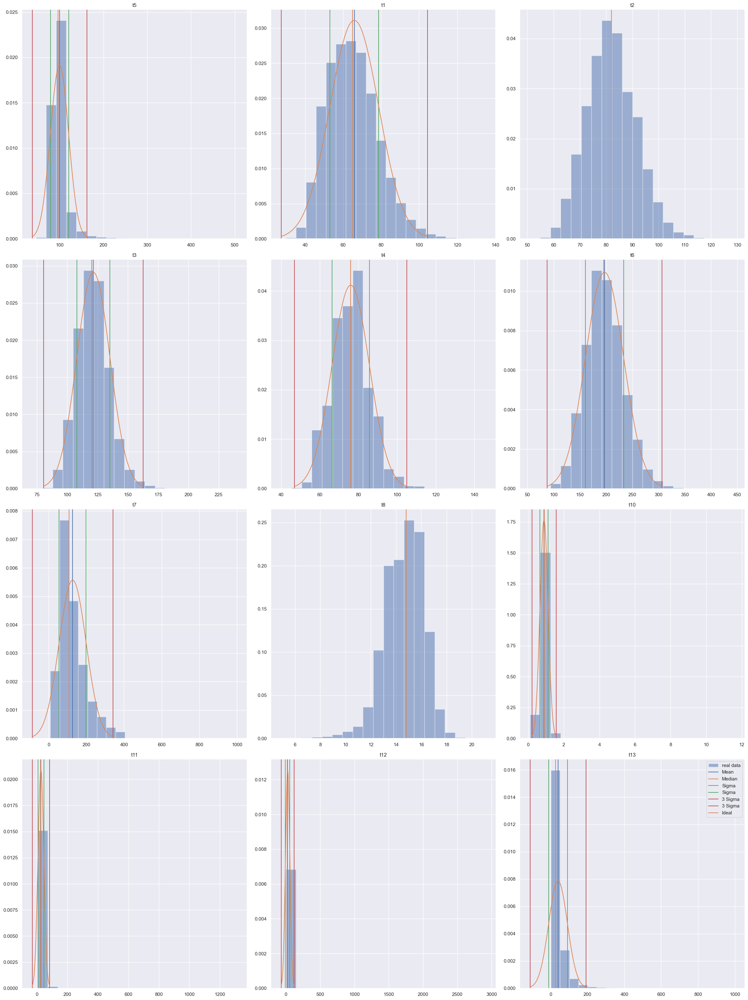

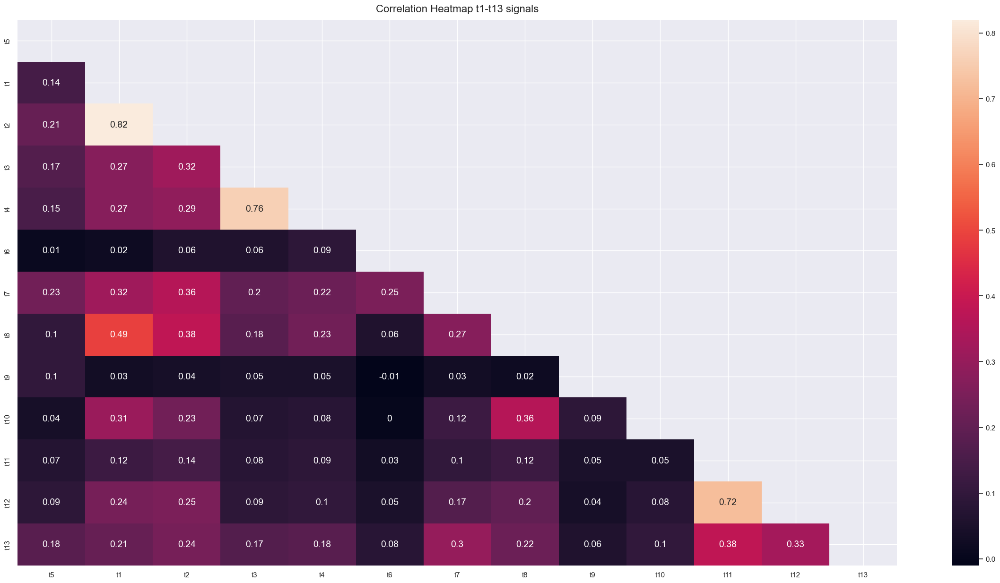

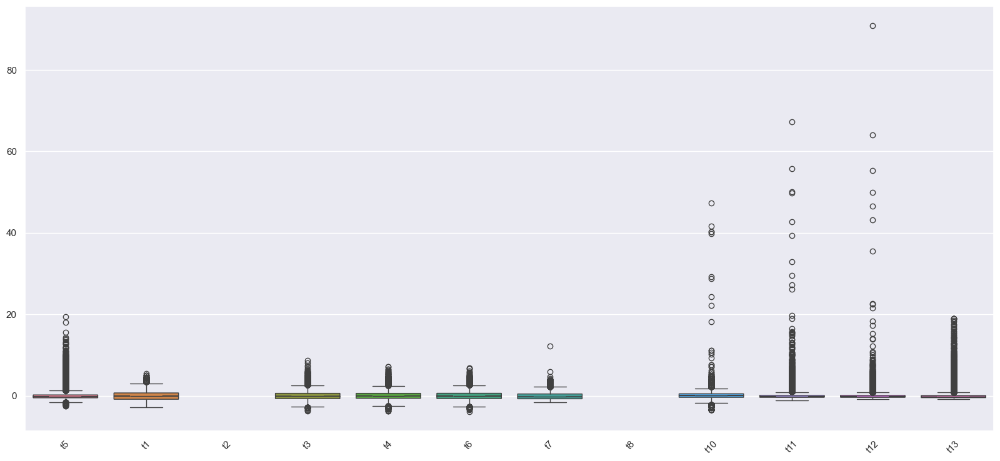

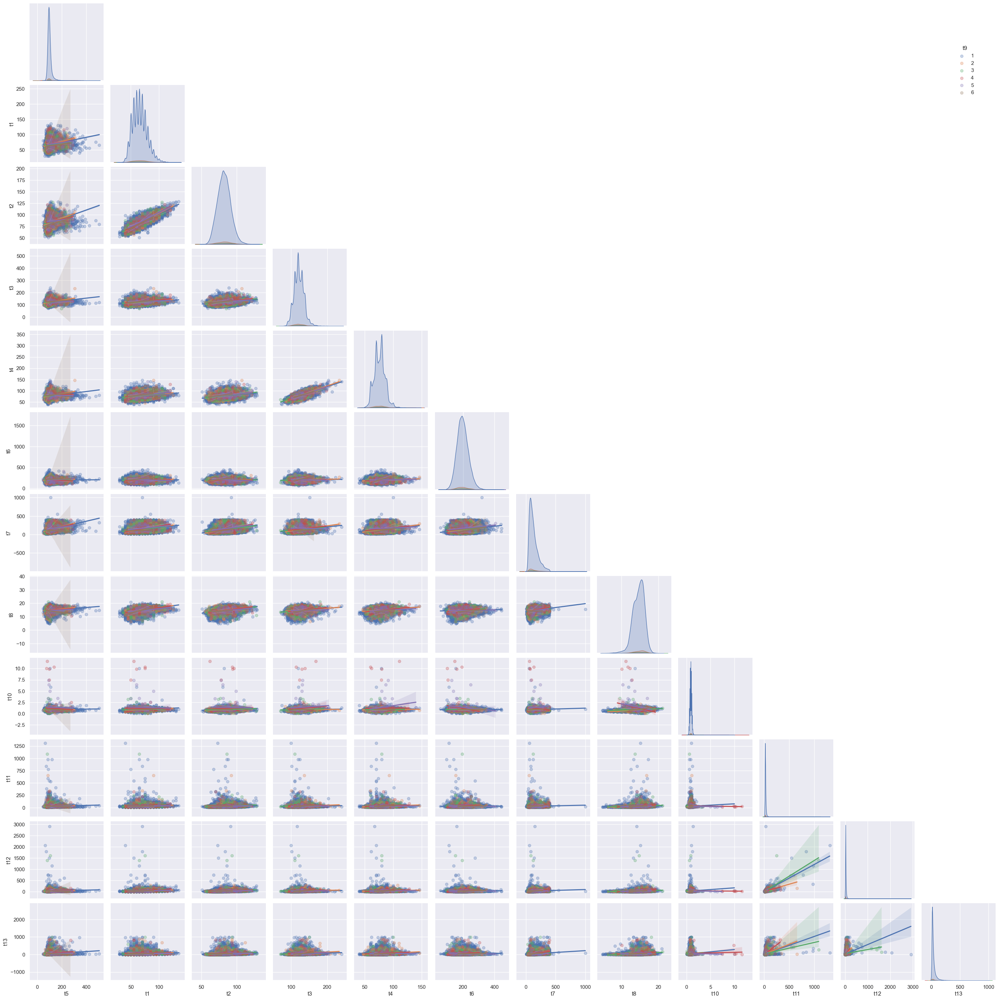

Save plot as ..\reports\figures\raw\feature_hists_df_raw.png
Save plot as ..\reports\figures\raw\feature_corr_matrix_df_raw.png
Save plot as ..\reports\figures\raw\feature_boxplot_df_raw.png
Save plot as ..\reports\figures\raw\feature_pairplot_df_raw.png
Save plot as ..\reports\figures\raw\categorical_boxplot_df_raw.png
Save plot as ..\reports\figures\raw\permutation_imp_df_raw.png


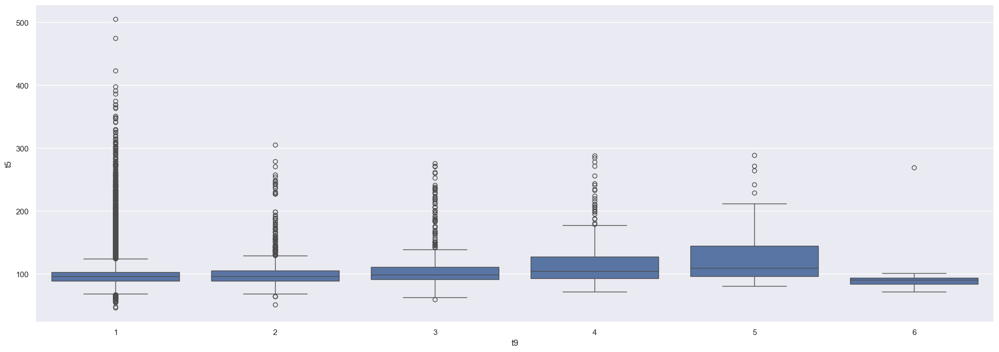

<Figure size 2000x1000 with 0 Axes>

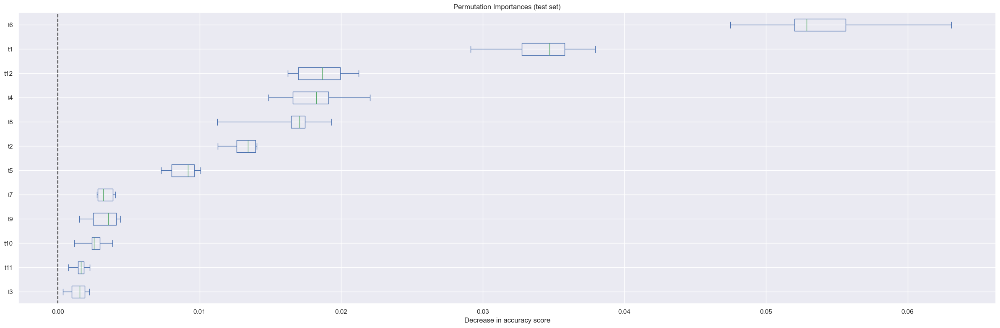

In [12]:
# TODO: wrap into exploration function with permutation importance as option 
fignames = [
    "feature_hists_df_raw.png",
    "feature_corr_matrix_df_raw.png",
    "feature_boxplot_df_raw.png",
    "feature_pairplot_df_raw.png",
    "categorical_boxplot_df_raw.png",
    "permutation_imp_df_raw.png"]

permutation_res = get_permutation_importance(
    df_raw,
    target_col=TARGET,
    train_test_cfg=IMPORTANCE_TRAIN_TEST_CFG,
    random_forest_cfg=IMPORTANCE_RF_CFG,
    random_state=SEED)

fig_hist = plot_grouped_hists(df_raw[NUMERIC_COLS], PALETTE);
fig_corr_matrix = plot_corr_matrix(df_raw, title="t1-t13 signals");
fig_boxplot = plot_boxplot(df_raw);
fig_pairplot = plot_pairplot(df_raw, hue_col=CATEGORICAL_COLS[0]);
plt.show() # otherwise fig_cat_boxplot would be plot on fig_pairplot
fig_cat_boxplot = sns.boxplot(x=CATEGORICAL_COLS[0], y=TARGET, data=df_raw);
fig_perm_imp = plot_vert_boxplot(permutation_res, columns=df_raw.columns)
# plot_power_prediciton(df_raw, columns=df_raw.columns)

if IS_SAVE_PLOTS:
    for fig, figname in zip([fig_hist,
                             fig_corr_matrix,
                             fig_boxplot,
                             fig_pairplot,
                             fig_cat_boxplot,
                             fig_perm_imp],
                            fignames):
        save_plot(fig, FIGURES_PATH / FIGURES_RAW / figname)

#### Explore target distribution

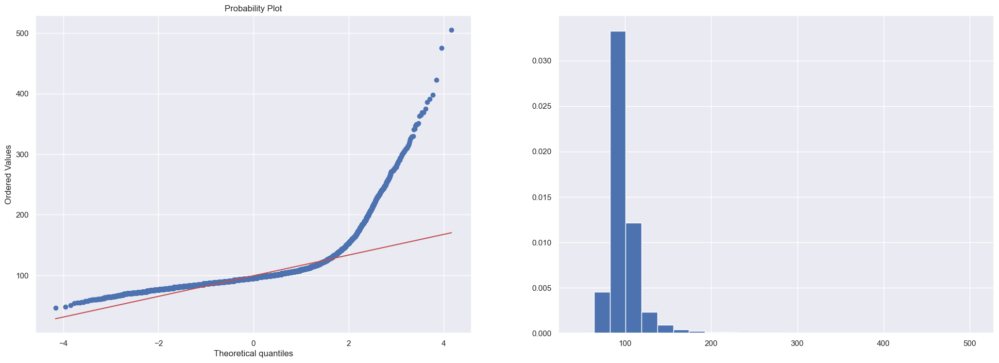

In [13]:
plot_qq_hist_plot(df_raw[TARGET]);

"Right" tail is long lasting, target should be normalised by transformation (log is acceptable-no zeros and negatives and easier to be interpreted) and by data cleaning.

#### Explore categorical feature

C:\Users\parshin_sa2\AppData\Local\Temp\ipykernel_19796\811381540.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_raw_cat_count = df_raw.groupby(CATEGORICAL_COLS[0])[[TARGET]].count()


,t5,share
t9,,
1,42080,94.45
2,1445,3.24
3,739,1.66
4,208,0.47
5,70,0.16
6,10,0.02


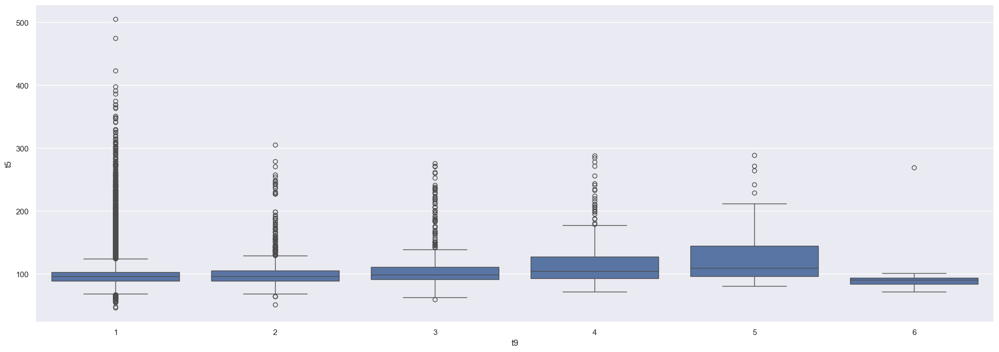

In [14]:
# TODO: wrap into cat exploration function 

sns.boxplot(x=CATEGORICAL_COLS[0], y=TARGET, data=df_raw)
df_raw_cat_count = df_raw.groupby(CATEGORICAL_COLS[0])[[TARGET]].count()
df_raw_cat_count["share"] = (df_raw_cat_count[TARGET] / df_raw.shape[0] * 100).round(2)
display(df_raw_cat_count)

#### Outcomes

1. Many outliers, which should be cleaned to have more resistant model (and using domain knowledge it is better to understand why we have it).
2. Based on pairplot and boxplot by categories it is not obvious categorical feature meaning (different types of equipment, shutdown/in operation, equipment mode etc).
3. Target should be normalised. Log-tranfsformation is planned.    

Other outputs going to be presented after transfomration

### Clip data

For training purposes let's cut at least t5, t7, t10-t13 for q99%. Potentially small values could be cut also.

In [15]:
# TODO: wrap into function?

df_clip: pd.DataFrame
quantiles_cut = {
    0.99: ["t5", "t7", "t10", "t11", "t12", "t13"]
}

df_clip = df_raw.copy()
for quantile_val, cols in quantiles_cut.items():
    for col in cols:
        df_clip = df_clip[df_clip[col] < df_clip[col].quantile(quantile_val)]
        
print(f"Deleted portion: {(len(df_raw) - len(df_clip)) / len(df_raw) * 100:.2f}%")

Deleted portion: 7.33%


Repeat exploration phase for __clipped__ dataset (7% - is accessible to be reduced? - required to be explored based on domain specifics)

### Feature transformation

c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\function_base.py:139: RuntimeWarning: invalid value encountered in scalar subtract
  delta = stop - start
c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\scipy\stats\_distn_infrastructure.py:1983: RuntimeWarning: invalid value encountered in subtract
  x = np.asarray((x - loc)/scale, dtype=dtyp)
c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\function_base.py:139: RuntimeWarning: invalid value encountered in scalar subtract
  delta = stop - start
c:\Users\parshin_

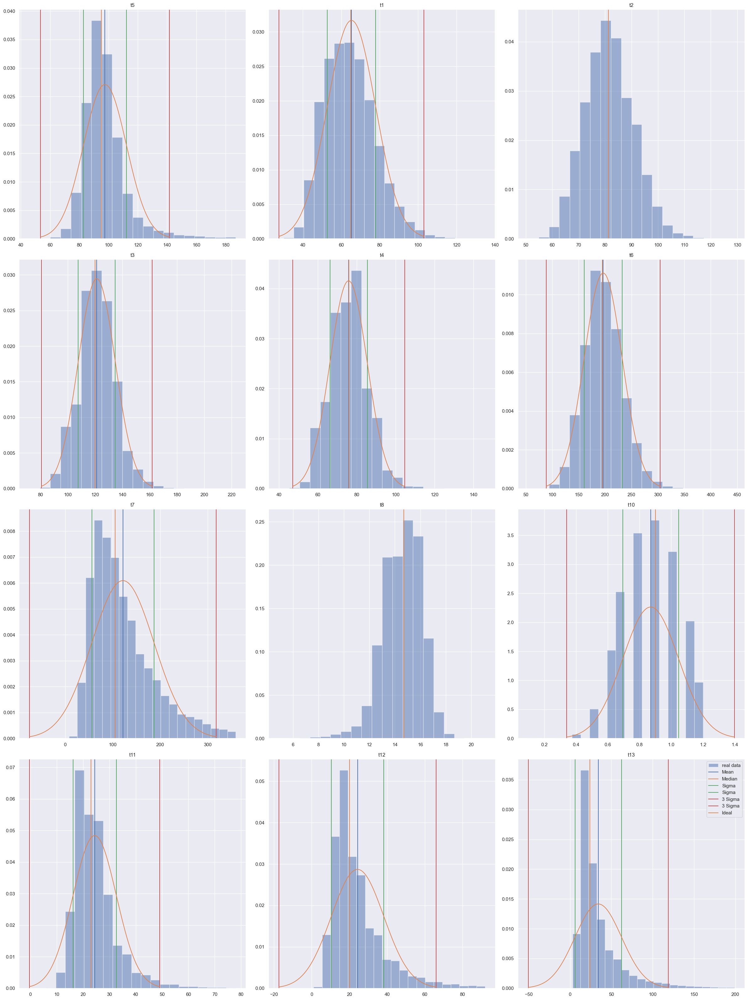

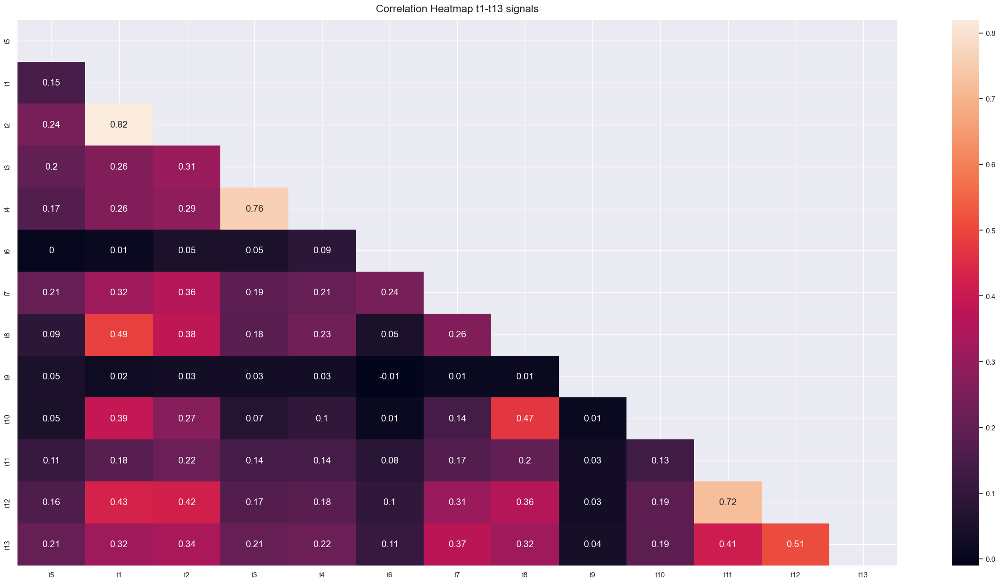

In [16]:
plot_grouped_hists(df_clip[NUMERIC_COLS], PALETTE);
plot_corr_matrix(df_clip, title="t1-t13 signals");

1. t5, t7, t11, t12, t13 looks positively skewed
2. t10 looks pseudo-categrical

##### Check t10

Let's multiply values by 10 and named it as categorical for simplicity

Raw data

(array([ 0.8,  1.1,  1. ,  1.3,  0.5,  0.7,  0.6,  0.9,  0.4,  1.2,  1.8,
         1.4,  1.5,  0.1,  7.5, 10. ,  1.6,  2.1, 10.3,  0.3,  1.7,  3.2,
         2. ,  2.3,  1.9,  2.2,  3.3,  5.9,  7.4,  2.5,  6.4,  3. , 11.6,
         2.6,  0.2,  3.4,  9.9,  5. ], dtype=float16),
 38)

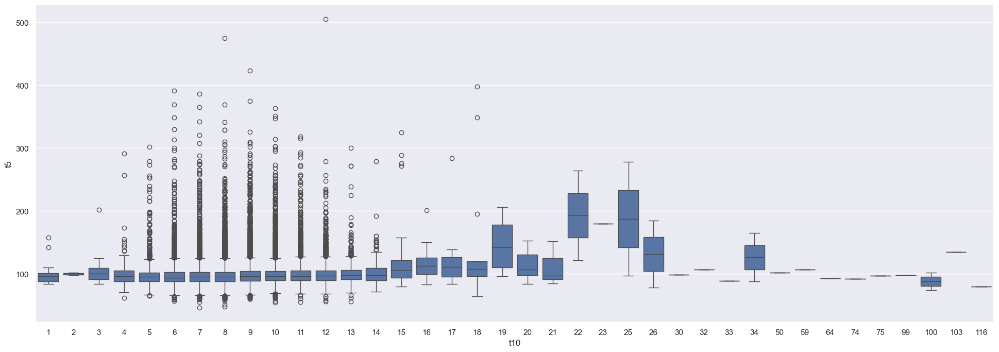

In [17]:
# TODO: wrap into the function?
df_clip_ = df_raw[[TARGET, "t10"]].copy()
df_clip_["t10"] = df_clip_["t10"] * 10
df_clip_ = df_clip_.astype({"t10": "int16"}).astype({"t10": "category"})
sns.boxplot(x="t10", y=TARGET, data=df_clip_)
df_raw["t10"].unique(), len(df_raw["t10"].unique())

Clipped data

(array([0.8, 1.1, 1. , 0.5, 0.7, 0.6, 0.9, 0.4, 1.2, 0.1, 0.3, 0.2],
       dtype=float16),
 12)

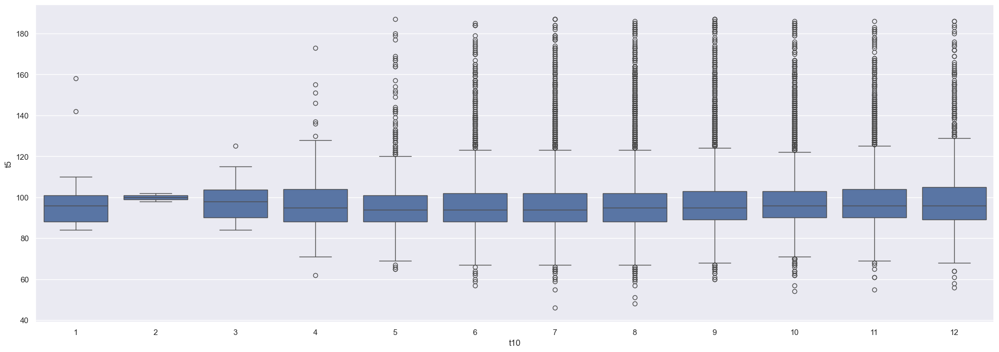

In [18]:
# TODO: wrap into the function?
df_clip_ = df_clip[[TARGET, "t10"]].copy()
df_clip_["t10"] = df_clip_["t10"] * 10
df_clip_ = df_clip_.astype({"t10": "int16"}).astype({"t10": "category"})
sns.boxplot(x="t10", y=TARGET, data=df_clip_)
df_clip["t10"].unique(), len(df_clip["t10"].unique())

By clipping data it was excluded 26 unique values upper 12. Probably the parameter is responsible for equipment modes, domain expertise is required. Based on statistics such outliers coud harm to the the model, therefore it is excluded.

##### Transform variables

In [19]:
cols_to_log = ["t5", "t7", "t11", "t12", "t13"]
dict_cols_log = {col: "log10_" + col for col in cols_to_log}

df_clip_trans = df_clip.copy()
df_clip_trans[cols_to_log] = np.log10(df_clip_trans[cols_to_log])
# df_clip_trans.rename(dict_cols_log, axis=1, inplace=True)

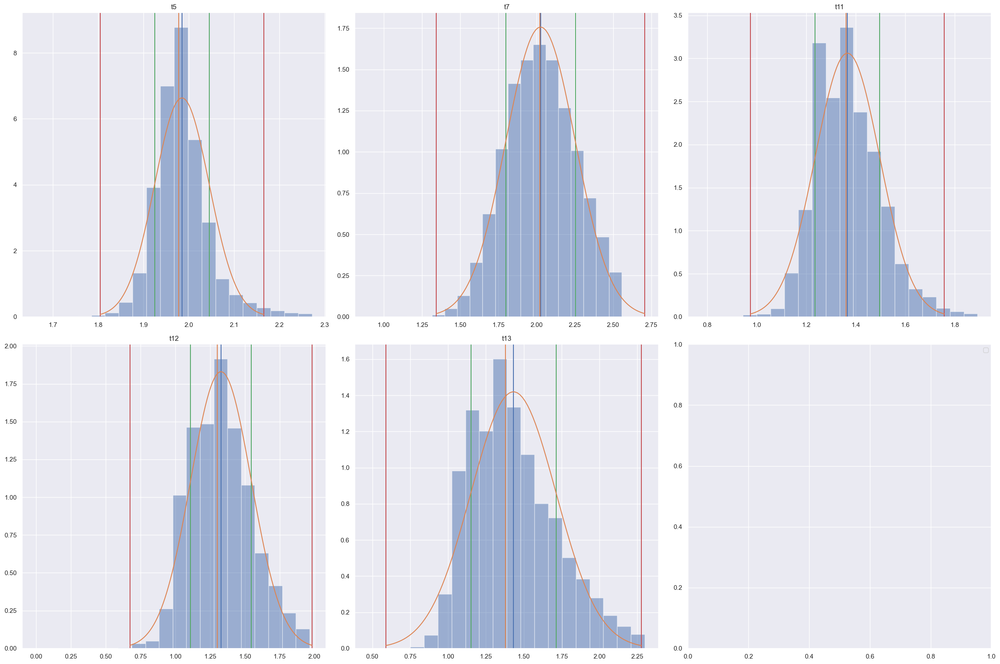

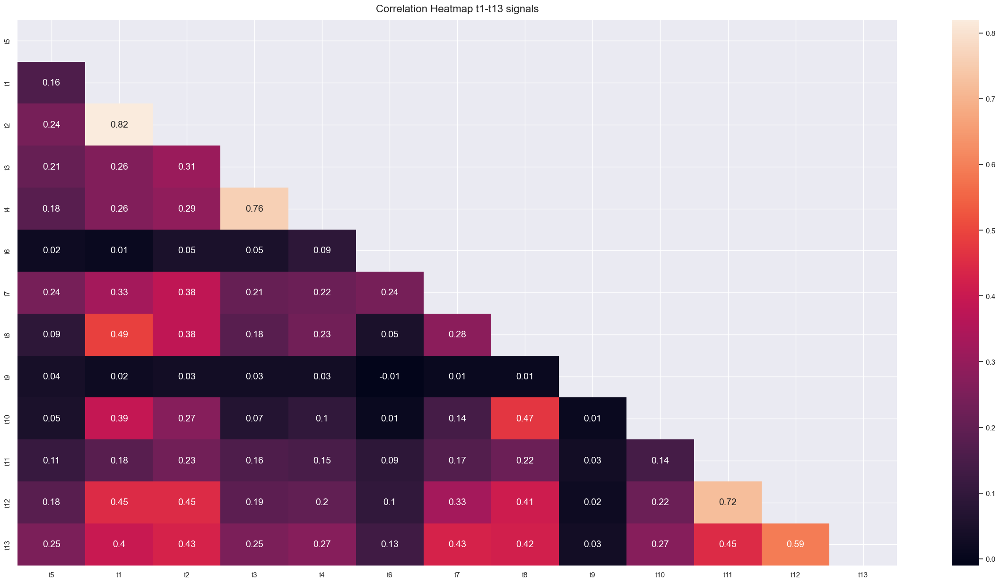

In [20]:
plot_grouped_hists(df_clip_trans[cols_to_log], PALETTE);
plot_corr_matrix(df_clip_trans, title="t1-t13 signals");

1. "t5", "t7", "t11", "t12", "t13" distributions looks better
2. "t5", "t7", "t11", "t12", "t13" correlations became higher

### Exlore data after preprocessing

Permeation: random forest MAE is 9.529
Permeation: random forest RMSE is 13.932


c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\function_base.py:139: RuntimeWarning: invalid value encountered in scalar subtract
  delta = stop - start
c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\scipy\stats\_distn_infrastructure.py:1983: RuntimeWarning: invalid value encountered in subtract
  x = np.asarray((x - loc)/scale, dtype=dtyp)
c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
c:\Users\parshin_sa2\Miniconda3\envs\t5_control\Lib\site-packages\numpy\core\function_base.py:139: RuntimeWarning: invalid value encountered in scalar subtract
  delta = stop - start
c:\Users\parshin_

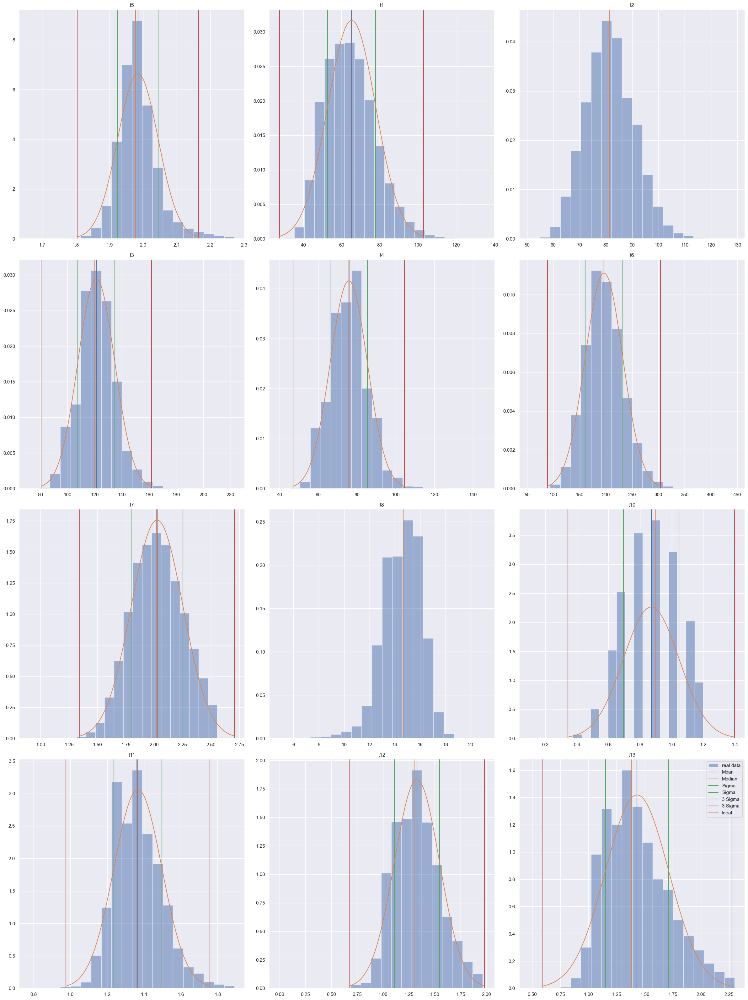

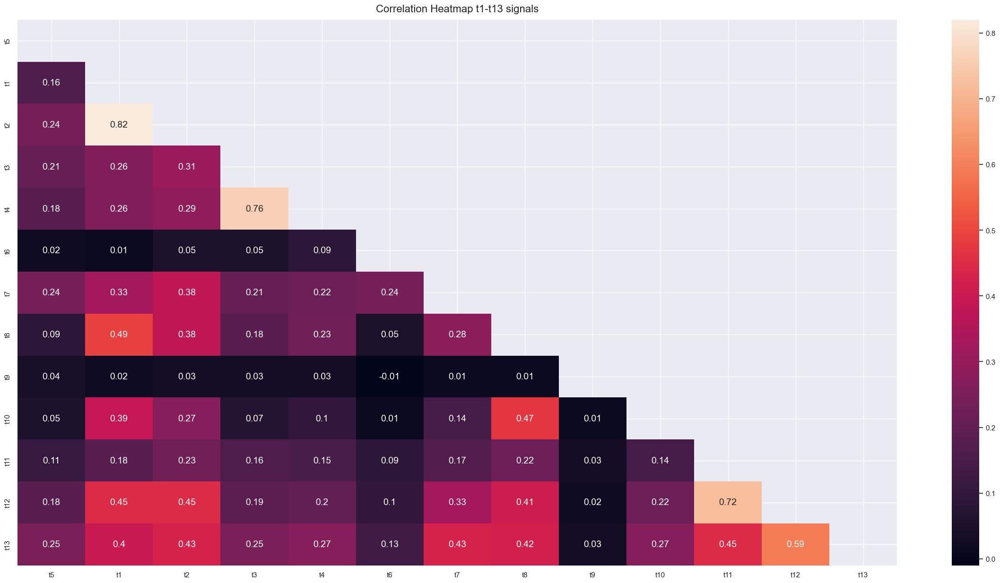

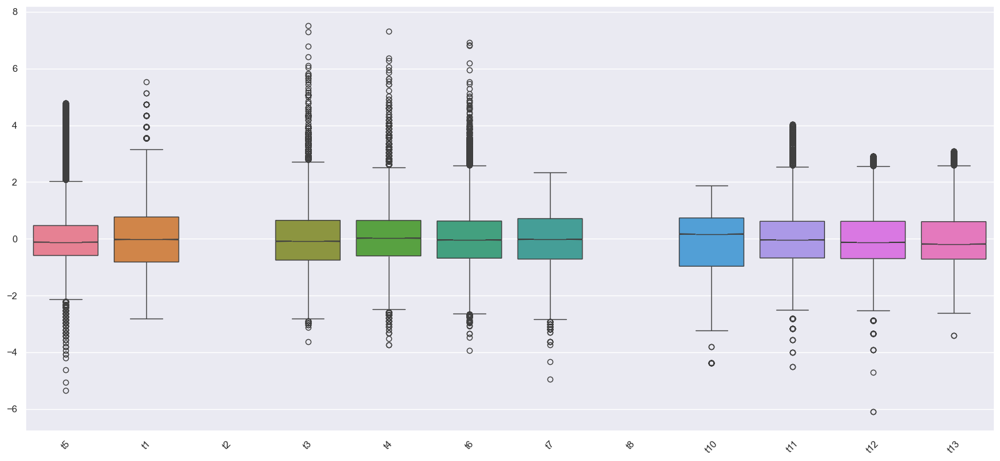

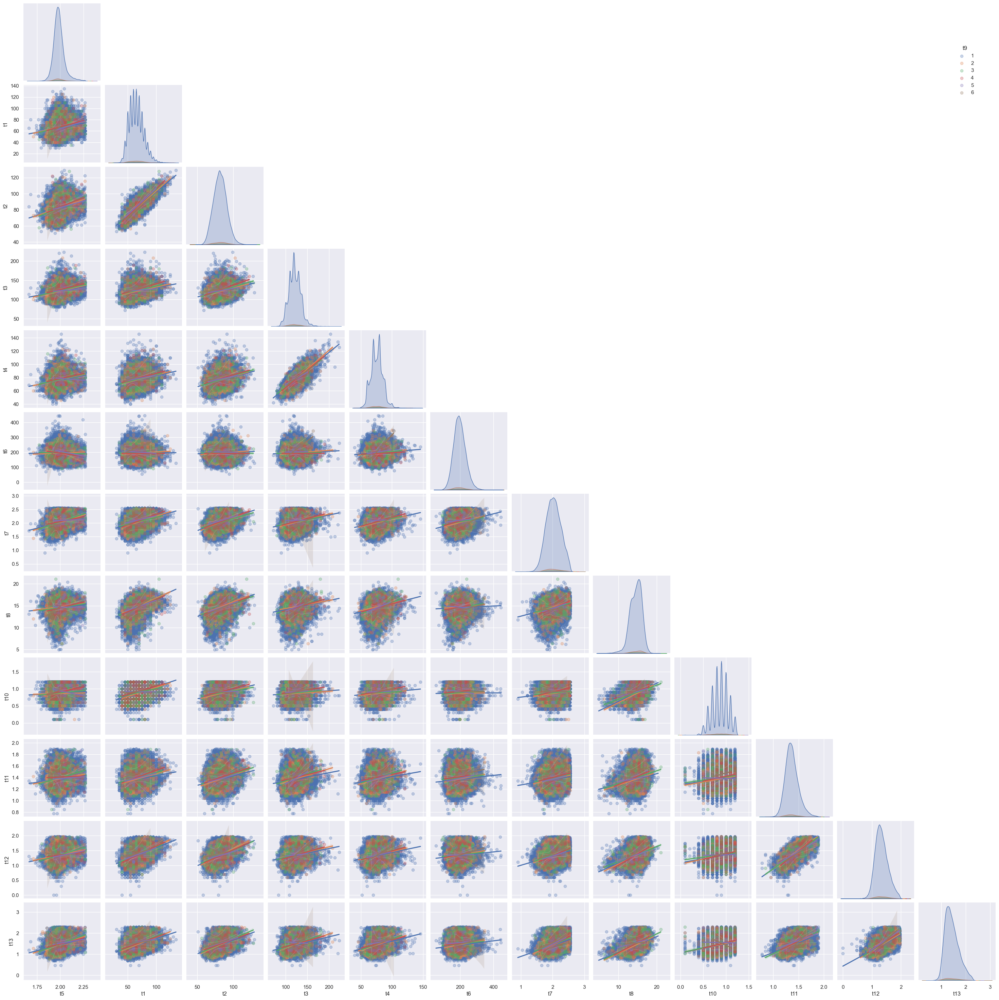

Save plot as ..\reports\figures\processed\feature_hists_df_clip.png
Save plot as ..\reports\figures\processed\feature_corr_matrix_df_clip.png
Save plot as ..\reports\figures\processed\feature_boxplot_df_clip.png
Save plot as ..\reports\figures\processed\feature_pairplot_df_clip.png
Save plot as ..\reports\figures\processed\categorical_boxplot_df_clip.png
Save plot as ..\reports\figures\processed\permutation_imp_df_clip.png


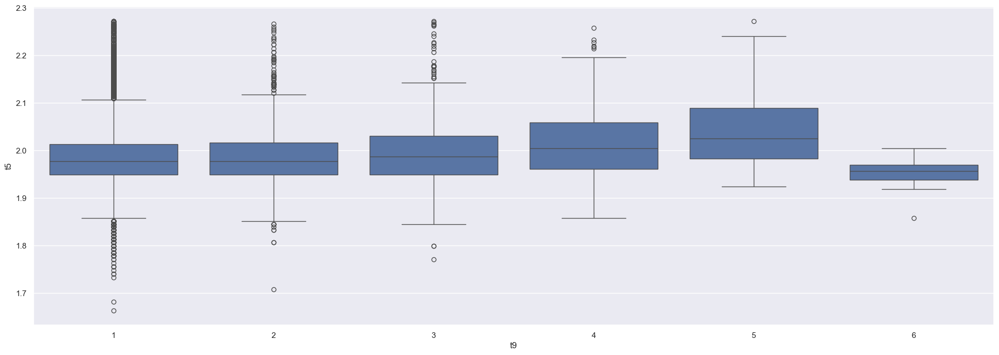

<Figure size 2000x1000 with 0 Axes>

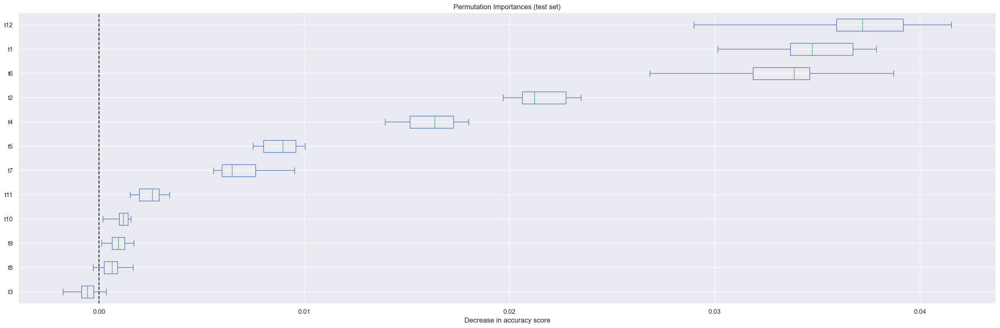

In [20]:
# TODO: wrap into exploration function with permutation importance as option 
fignames = [
    "feature_hists_df_clip.png",
    "feature_corr_matrix_df_clip.png",
    "feature_boxplot_df_clip.png",
    "feature_pairplot_df_clip.png",
    "categorical_boxplot_df_clip.png",
    "permutation_imp_df_clip.png"]

permutation_res = get_permutation_importance(
    df_clip_trans,
    target_col=TARGET,
    train_test_cfg=IMPORTANCE_TRAIN_TEST_CFG,
    random_forest_cfg=IMPORTANCE_RF_CFG,
    random_state=SEED,
    reverse_transform="log10")

fig_hist = plot_grouped_hists(df_clip_trans[NUMERIC_COLS], PALETTE);
fig_corr_matrix = plot_corr_matrix(df_clip_trans, title="t1-t13 signals");
fig_boxplot = plot_boxplot(df_clip_trans);
fig_pairplot = plot_pairplot(df_clip_trans, hue_col=CATEGORICAL_COLS[0]);
plt.show() # otherwise fig_cat_boxplot would be plot on fig_pairplot
fig_cat_boxplot = sns.boxplot(x=CATEGORICAL_COLS[0], y=TARGET, data=df_clip_trans);
fig_perm_imp = plot_vert_boxplot(permutation_res, columns=df_clip_trans.columns)
# plot_power_prediciton(df_raw, columns=df_raw.columns)

if IS_SAVE_PLOTS:
    for fig, figname in zip([fig_hist,
                             fig_corr_matrix,
                             fig_boxplot,
                             fig_pairplot,
                             fig_cat_boxplot,
                             fig_perm_imp],
                            fignames):
        save_plot(fig, FIGURES_PATH / FIGURES_PROCESSED / figname)

#### Explore target distribution

Kolmogorov-Smirnov normality test:
 KstestResult(statistic=0.08778784618223368, pvalue=2.7648181969721376e-277, statistic_location=1.9956352, statistic_sign=1)


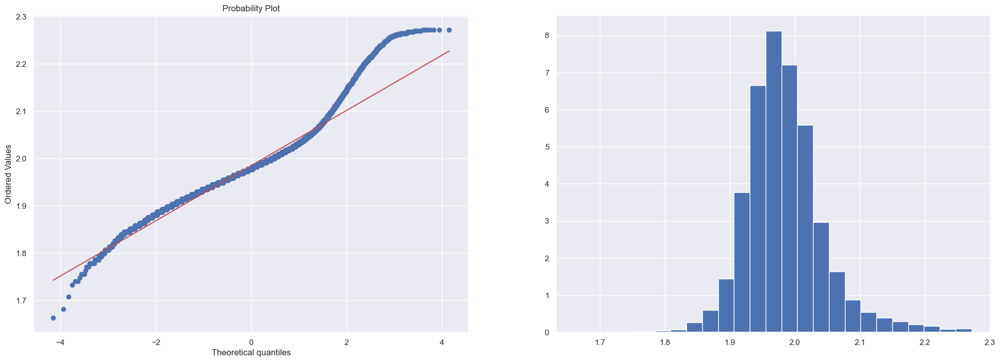

In [21]:
plot_qq_hist_plot(df_clip_trans[TARGET]);
print("Kolmogorov-Smirnov normality test:\n", 
      stats.kstest(df_clip_trans[TARGET],
                   "norm",
                   args=(df_clip_trans[TARGET].mean(), df_clip_trans[TARGET].std())))
# print("Shapiro-Wilk normality test:\n", stats.shapiro(df_clip_trans[TARGET]))
# stats.anderson(df_clip_trans[TARGET], dist="norm", args=(df_clip_trans[TARGET].mean(), df_clip_trans[TARGET].std())))

Distribution is still not fully normal. Other actions to manage it is to use domain knowledge or to apply to non-linear approaches.

#### Explore categorical features

In [22]:
# TODO: wrap into cat exploration function 

df_clip_cat_count = df_clip_trans.groupby(CATEGORICAL_COLS[0])[[TARGET]].count()
df_clip_cat_count["share"] = (df_clip_cat_count[TARGET] / df_clip_trans.shape[0] * 100).round(2)
df_clip_cat_count["share_raw"] = df_raw_cat_count["share"]
display(df_clip_cat_count)

C:\Users\parshin_sa2\AppData\Local\Temp\ipykernel_19796\1546802897.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_clip_cat_count = df_clip_trans.groupby(CATEGORICAL_COLS[0])[[TARGET]].count()


,t5,share,share_raw
t9,,,
1,39180,94.90,94.45
2,1303,3.16,3.24
3,608,1.47,1.66
4,147,0.36,0.47
5,39,0.09,0.16
6,8,0.02,0.02


Share of categories was not changed dramatically, but:
1. Parameters distributions have better shapes (closer to normal distribution)
2. MSE and RMSE reduced significantly

#### Outcomes

1. Paired/high correlated features: t1-t2, t3-t4, t11-t12. Could be the preblem for interpretation.
2. Strange values for t10 (required to deep dive into the domain)
3. Linear dependency with target (higher than for others from corr matrix): t2, t7, t13, t3
4. Nonlinear with target (higher than for others from permutation importance): t12, t1, t6, t2, t4. Required domain expertise or usage of non-limer models (interpretation is under question in a such case). 
5. No clear linear and other (squared, 1/2 etc) types of dependency on pairplot with target.

### PCA

Explained variance of 2 components 0.8822892394175208


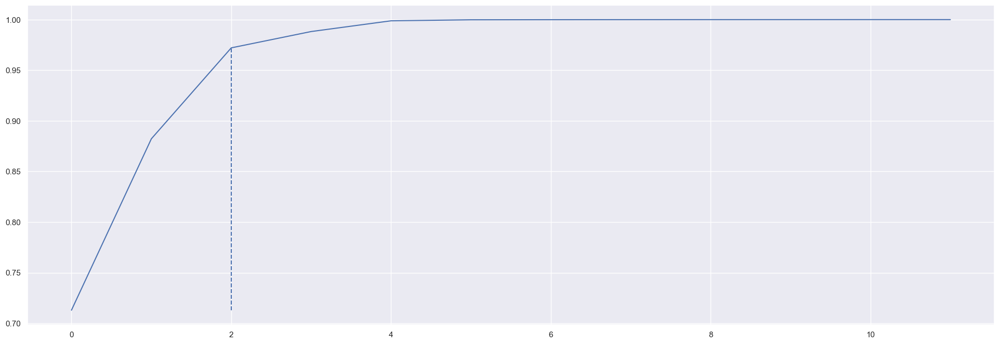

In [23]:
plot_and_get_pca(df_clip_trans.loc[:, df_clip_trans.columns != TARGET], SEED, is_plot=True);

3 "grouped" features explain around 97% of variance, 5 variables could explain almost all variance changes. Presumably, some features could be combined (excluded, combined in formula etc - based on domain context). Because PSA harms to feature interpretation such method is omitted for the current level on case development.

# 3. Explore models

In [24]:
# features columns as string
str_features_df_clip = " + ".join(list(
    set(df_clip.columns) - set(['t5'])
    ))

### Train-test dataset

Test dataset is just to test

In [25]:
df_clip_trans_train, df_clip_trans_test = train_test_split(df_clip_trans,
                                                           test_size=TEST_SIZE,
                                                           random_state=SEED,
                                                           stratify=df_clip_trans[CATEGORICAL_COLS])

df_filter = df_raw.index.isin(df_clip_trans_test.index)
df_raw_test, df_raw_train = df_raw[df_filter], df_raw[~df_filter]

df_filter = df_clip.index.isin(df_clip_trans_test.index)
df_clip_test, df_clip_train = df_clip[df_filter], df_clip[~df_filter]

### Variance inflation factor

In [26]:
vif_clip_trans = get_vif(df_clip_trans, TARGET, str_features_df_clip)
display(vif_clip_trans)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
VIF Factor,317.054178,11.520578,6.006955,2.240424,1.326548,1.06663,2.434503,1.663363,2.275445,3.074988,1.081482,1.839664,1.375666,3.706856,3.39033,1.399008,2.435719
R2,0.996846,0.913199,0.833526,0.553656,0.246164,0.062468,0.589238,0.398808,0.560526,0.674795,0.075343,0.456422,0.273079,0.73023,0.705043,0.285208,0.589444
features,t9[1],t9[2],t9[3],t9[4],t9[5],t9[6],t3,t8,t11,t12,t6,t13,t10,t1,t2,t7,t4


Taken into account previous outcome let's exclude t12, t1, t4

In [27]:
# t1/t2, t4?, t12/t11
features_df_clip_vif = list(
    set(df_clip.columns) - set(['t5', 't12', 't1', 't4'])
    )
str_features_df_clip_vif = " + ".join(features_df_clip_vif)

# second version
str_features_df_clip_vif_ = " + ".join(list(
    set(df_clip.columns) - set(['t5', 't12', 't1'])
    ))

In [28]:
vif_clip_trans_clean = get_vif(df_clip_trans, TARGET, str_features_df_clip_vif)
display(vif_clip_trans_clean)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
VIF Factor,257.835246,9.57309,5.061234,2.005425,1.262283,1.054544,1.526333,1.260969,1.455218,1.072429,1.722851,1.138989,1.386566,1.313308
R2,0.996122,0.895541,0.80242,0.501353,0.207785,0.051723,0.344835,0.206959,0.312818,0.067537,0.419567,0.122029,0.278794,0.238564
features,t9[1],t9[2],t9[3],t9[4],t9[5],t9[6],t8,t11,t2,t6,t13,t3,t7,t10


In [29]:
vif_clip_trans_clean = get_vif(df_clip_trans, TARGET, str_features_df_clip_vif_)
display(vif_clip_trans_clean)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
VIF Factor,257.919579,9.577627,5.063036,2.005801,1.262461,1.054603,1.538425,1.261273,1.455322,1.076055,1.727988,2.430501,1.387461,2.431829,1.313419
R2,0.996123,0.89559,0.80249,0.501446,0.207896,0.051776,0.349984,0.207151,0.312867,0.07068,0.421292,0.588562,0.279259,0.588787,0.238628
features,t9[1],t9[2],t9[3],t9[4],t9[5],t9[6],t8,t11,t2,t6,t13,t3,t7,t4,t10


### Linear models

NOTE. Also quantile regression (smf.quantreg) could be used for the case. The result of the model could be the median value of the predicted parameter, which could be more realistic than mean (because mean value could be not possible - real value).   
NOTE. It is also possible to create a model using `scikit-learn`, but it is easier to use `statsmodels` at least for data and model anaylsis using statistics principles.

#### Linear model with raw data and common, log-only features

                            OLS Regression Results                            
Dep. Variable:                     t5   R-squared:                       0.105
Model:                            OLS   Adj. R-squared:                  0.104
Method:                 Least Squares   F-statistic:                     294.8
Date:                Sun, 28 Jan 2024   Prob (F-statistic):               0.00
Time:                        21:07:48   Log-Likelihood:            -1.7895e+05
No. Observations:               40423   AIC:                         3.579e+05
Df Residuals:                   40406   BIC:                         3.581e+05
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     53.5819      1.558     34.396      0.0

LM Statistic        6.238285e+02
LM-Test p-value    2.009133e-122
F-Statistic         3.958376e+01
F-Test p-value     2.011182e-123
dtype: float64

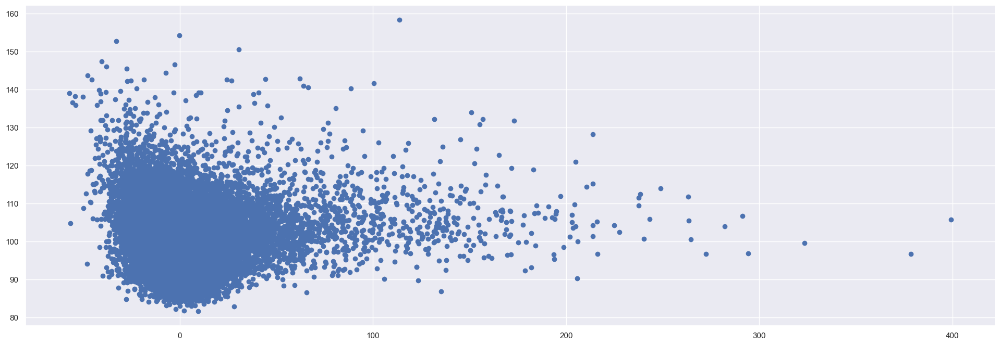

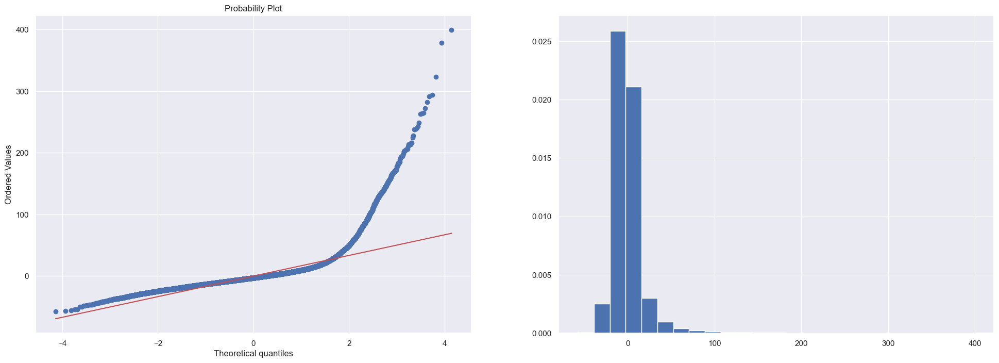

In [30]:
model_v0, _, _ = create_explore_ols(df_raw_train,
                                    TARGET,
                                    str_features_df_clip,
                                    normality_test_kind=NORMALITY_TEST)
print("Heteroskedasticity (Breusch-Pagan test)") # White test is also exist
pd.Series(get_hetero_breusch_pagan(model_v0.resid, model_v0.model.exog)) # get_hetero_white_test

### Linear model with clip data and common, log-only features

                            OLS Regression Results                            
Dep. Variable:                     t5   R-squared:                       0.126
Model:                            OLS   Adj. R-squared:                  0.126
Method:                 Least Squares   F-statistic:                     336.0
Date:                Sun, 28 Jan 2024   Prob (F-statistic):               0.00
Time:                        21:08:35   Log-Likelihood:                 54113.
No. Observations:               37156   AIC:                        -1.082e+05
Df Residuals:                   37139   BIC:                        -1.080e+05
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.7806      0.005    333.367      0.0

LM Statistic        9.631272e+02
LM-Test p-value    8.751349e-195
F-Statistic         6.176904e+01
F-Test p-value     1.904461e-197
dtype: float64

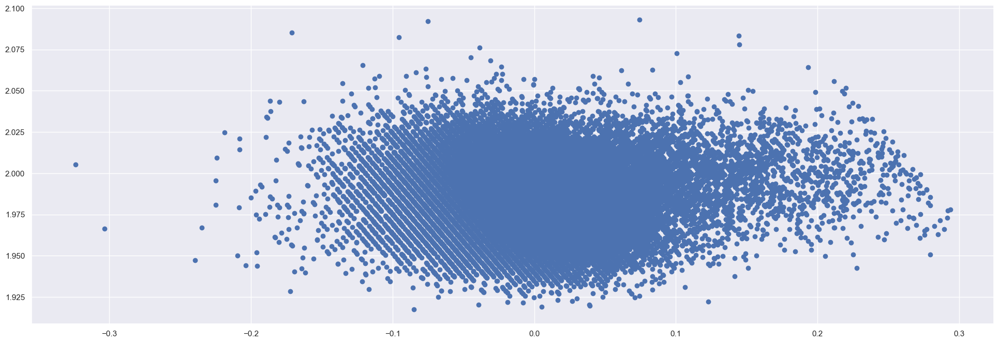

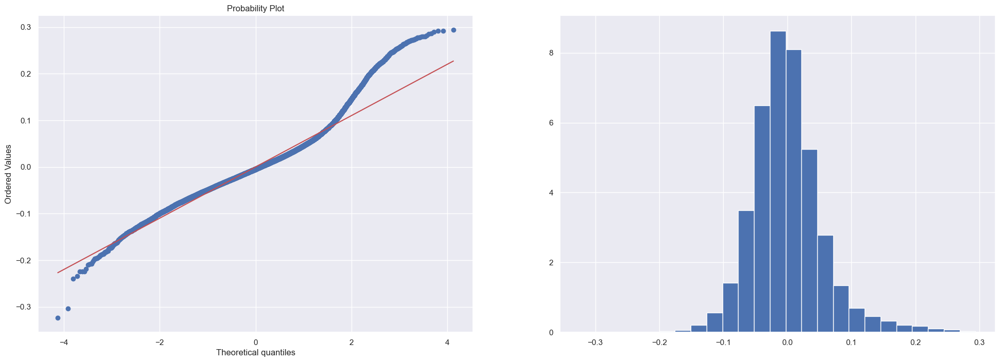

In [31]:
model_v1, _, _ = create_explore_ols(df_clip_trans_train,
                                    TARGET,
                                    str_features_df_clip,
                                    normality_test_kind=NORMALITY_TEST)
print("Heteroskedasticity (Breusch-Pagan test)") # White test is also exist
pd.Series(get_hetero_breusch_pagan(model_v1.resid, model_v1.model.exog)) # get_hetero_white_test

t4 and t10 have not significant p-value, therefore results could be doubtful. Although the model shows better results (even than others), if some features correlated and have not significant p-value, the model interpretation could be diutful. 

### Linear model with clip data and common, log-only, excluded by multicollinear and by VIF features

IMPORTANT. Such model with target and features log transformations has some difficulties in interpretation (It would be shown hereinbelow - "How to use the model").

                            OLS Regression Results                            
Dep. Variable:                     t5   R-squared:                       0.120
Model:                            OLS   Adj. R-squared:                  0.119
Method:                 Least Squares   F-statistic:                     387.9
Date:                Sun, 28 Jan 2024   Prob (F-statistic):               0.00
Time:                        21:08:40   Log-Likelihood:                 53967.
No. Observations:               37156   AIC:                        -1.079e+05
Df Residuals:                   37142   BIC:                        -1.078e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.7949      0.005    370.820      0.0

LM Statistic        8.074830e+02
LM-Test p-value    3.448063e-164
F-Statistic         6.347002e+01
F-Test p-value     4.681705e-166
dtype: float64

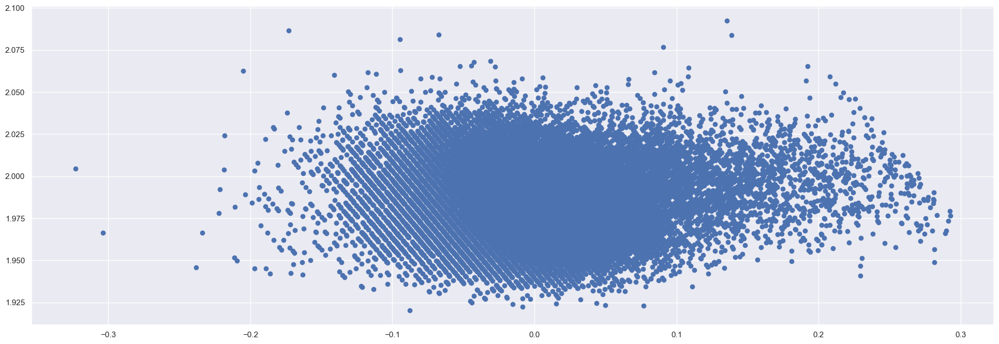

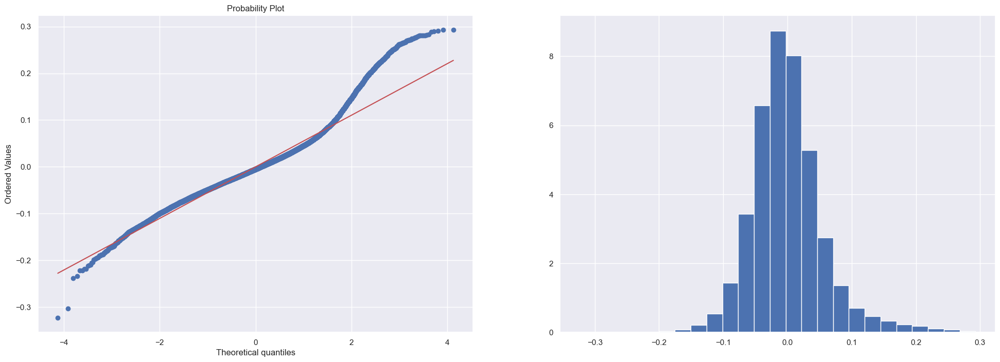

In [32]:
model_v2, _, _ = create_explore_ols(df_clip_trans_train,
                                    TARGET,
                                    str_features_df_clip_vif,
                                    normality_test_kind=NORMALITY_TEST) # str_features_df_raw_vif_ str_features_df_raw_vif str_features_df_raw
print("Heteroskedasticity (Breusch-Pagan test)") # White test is also exist
pd.Series(get_hetero_breusch_pagan(model_v2.resid, model_v2.model.exog)) # get_hetero_white_test
# stats.jarque_bera(model_v2.resid) - also for normality whether skewness and kurtosis matching a normal distribution

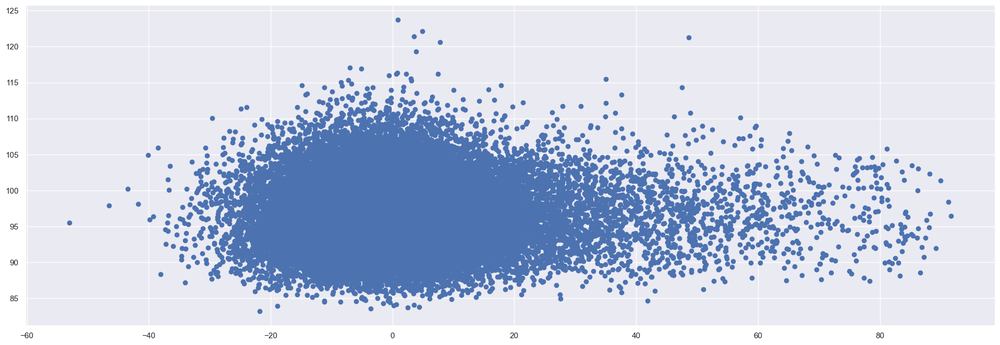

In [33]:
residuals = df_clip_train[TARGET] - 10 ** model_v2.predict(df_clip_trans_train)
plt.scatter(residuals, 10 ** model_v2.predict(df_clip_trans_train))

### Linear model with clip data and common, specific log-only, excluded by multicollinear and by VIF features

#### Simplified version of model_v2 with log transformation for target-only

                            OLS Regression Results                            
Dep. Variable:                     t5   R-squared:                       0.110
Model:                            OLS   Adj. R-squared:                  0.110
Method:                 Least Squares   F-statistic:                     353.7
Date:                Sun, 28 Jan 2024   Prob (F-statistic):               0.00
Time:                        21:08:52   Log-Likelihood:                 53770.
No. Observations:               37156   AIC:                        -1.075e+05
Df Residuals:                   37142   BIC:                        -1.074e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.8577      0.004    433.139      0.0

LM Statistic        7.634606e+02
LM-Test p-value    9.191051e-155
F-Statistic         5.993717e+01
F-Test p-value     1.990504e-156
dtype: float64

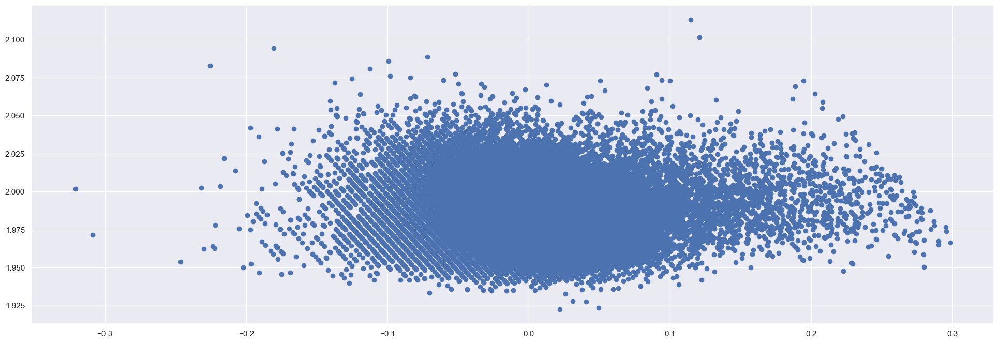

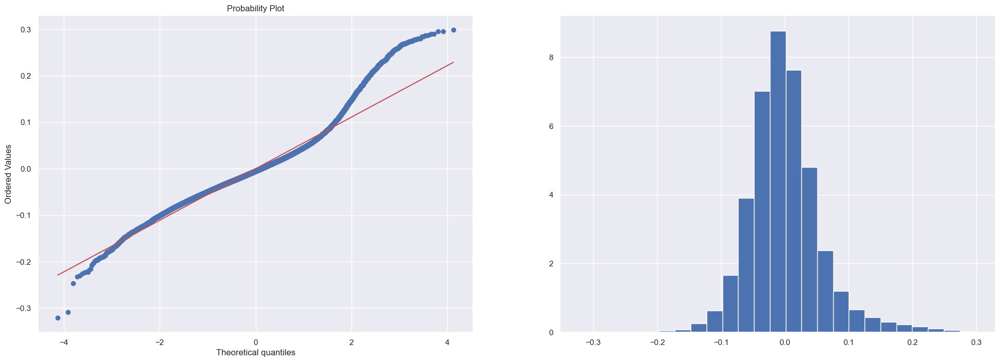

In [34]:
df_clip_train_ = df_clip_train.copy()
df_clip_train_[TARGET] = np.log10(df_clip_train[TARGET])
model_v3, _, _ = create_explore_ols(df_clip_train_,
                                    TARGET,
                                    str_features_df_clip_vif,
                                    normality_test_kind=NORMALITY_TEST) # str_features_df_raw_vif_ str_features_df_raw_vif str_features_df_raw
print("Heteroskedasticity (Breusch-Pagan test)") # White test is also exist
pd.Series(get_hetero_breusch_pagan(model_v3.resid, model_v3.model.exog)) # get_hetero_white_test

### Simplified version of model_v2 with log transformation for features only

                            OLS Regression Results                            
Dep. Variable:                     t5   R-squared:                       0.113
Model:                            OLS   Adj. R-squared:                  0.113
Method:                 Least Squares   F-statistic:                     363.5
Date:                Sun, 28 Jan 2024   Prob (F-statistic):               0.00
Time:                        21:08:57   Log-Likelihood:            -1.5055e+05
No. Observations:               37156   AIC:                         3.011e+05
Df Residuals:                   37142   BIC:                         3.013e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     53.2454      1.190     44.758      0.0

LM Statistic        9.340262e+02
LM-Test p-value    2.546856e-191
F-Statistic         7.367309e+01
F-Test p-value     7.762321e-194
dtype: float64

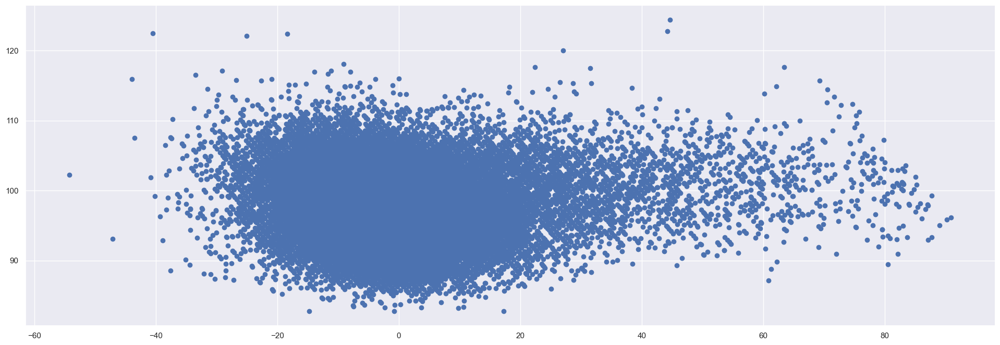

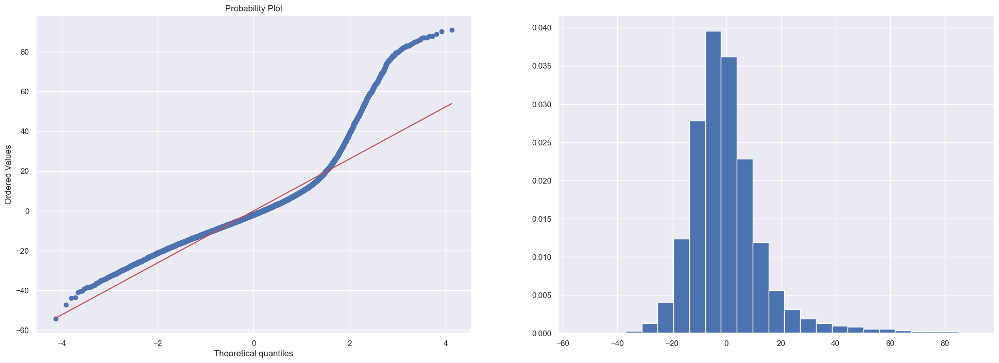

In [35]:
df_clip_train_ = df_clip_train.copy()
df_clip_train_[["t7", "t11", "t12", "t13"]] = np.log10(df_clip_train[["t7", "t11", "t12", "t13"]])
model_v4, _, _ = create_explore_ols(df_clip_train_,
                                    TARGET,
                                    str_features_df_clip_vif,
                                    normality_test_kind=NORMALITY_TEST) # str_features_df_raw_vif_ str_features_df_raw_vif str_features_df_raw
print("Heteroskedasticity (Breusch-Pagan test)") # White test is also exist
pd.Series(get_hetero_breusch_pagan(model_v4.resid, model_v4.model.exog)) # get_hetero_white_test

Both models v3 and v4 are worse than model v2. But models v3-v4 are easier for interpretation. Therefore model choice depences on the level of results interpretation of the case.

### Test results

In [36]:
print(f"Data distribution {df_raw_test[TARGET].mean():.1f} +- {df_raw_test[TARGET].std():.1f}")
print("Model v0")
calculate_metrics(model_v0.predict(df_raw_test),
                  df_raw_test[TARGET])

print("Model v1")
calculate_metrics(model_v1.predict(df_clip_trans_test),
                  df_clip_trans_test[TARGET], True)

print("Model v2")
calculate_metrics(model_v2.predict(df_clip_trans_test),
                  df_clip_trans_test[TARGET], True)

Data distribution 97.2 +- 14.2
Model v0
MAE is 9.790 RMSE is 13.609
Model v1
MAE is 9.233 RMSE is 13.380
Model v2
MAE is 9.263 RMSE is 13.444


### Full dataset result

In [37]:
print(f"Data distribution {df_raw[TARGET].mean():.1f} +- {df_raw[TARGET].std():.1f}")
print("Model v0")
calculate_metrics(model_v0.predict(df_raw),
                  df_raw[TARGET])

print("Model v1")
calculate_metrics(model_v1.predict(df_clip_trans),
                  df_clip_trans[TARGET], True)

print("Model v2")
calculate_metrics(model_v2.predict(df_clip_trans),
                  df_clip_trans[TARGET], True)

Data distribution 99.3 +- 20.8
Model v0
MAE is 11.443 RMSE is 19.727
Model v1
MAE is 9.466 RMSE is 13.837
Model v2
MAE is 9.487 RMSE is 13.897


Both models v1 and v2 could be taken into account. But Breusch-Pagan and Kolmogorov-Smirnov tests have significant p-value, R2 has low value therefore:
1. Required domain expertise (mentioned hereinabove)
2. Take into consideration non-linear methods
3. Clustering method could be taken into account both as for feature generation for linear model, as standalone model (could be interpreted)
4. As for p.4 Decision tree could be used
5. If it is applicable - clean more data

It is also possible to use Bayesian models for better interpretation. 

NOTE: Current models can estimate overall tendency. It is also possible to group data depending on data changes and then create a model based on grouped data. And it is also a __question__, whether we have high-fluctuated processes in data which could be interpreted as transitional modes (therefore should be cleaned or processed in specific ways using autocorrelations and other approaches for time-series-alike and non-stationary processes).

# 4. How to use model

<div class="alert-info">
IMPORTANT. It is not taken into consideration the adjustment influence of feature on each other
</div>

#### Model and data describtion

Model v2 is:   
$$log_{10}(t5)=a0+a2*t2+a3*t3+a6*t6+a7*log_{10}(t7)+a8*t8+a9_2*t9_2+a9_3*t9_3+a9_4*t9_4+a9_5*t9_5+a9_6*t9_6+a10*t10+a11*log_{10}(t11)+a13*log_{10}(t13)$$

$$t5=10^{a0} \cdot 10^{a2*t2} \cdot 10^{a3*t3} \cdot 10^{a6*t6} \cdot t7^{a7} \cdot 10^ {a8*t8} \cdot 10^{a9_2*t9_2} \cdot 10^{a9_3*t9_3} \cdot 10^{a9_4*t9_4} \cdot 10^{a9_5*t9_5} \cdot 10^{a9_6*t9_6} \cdot 10^{a10*t10} \cdot t11^{a11} \cdot t13^{a13}$$

When:
* t2, t3, t6, t8, t9, t10 increased by 1, then t5 increased by $1 \cdot 10^{a2}..10^{a10}$
* t7, t11, t13 increased by 1, then t5 increased by power pattern   

Coefficients are shown hereinbelow

In [38]:
model_v2.params

Intercept    1.794927
t9[T.2]      0.000187
t9[T.3]      0.009122
t9[T.4]      0.025550
t9[T.5]      0.045356
t9[T.6]     -0.033426
t8          -0.002391
t11         -0.005833
t2           0.000793
t6          -0.000075
t13          0.031688
t3           0.000536
t7           0.037704
t10         -0.004930
dtype: float64

Data bounds (should be cleared using domain knowledge)

In [39]:
df_clip_bounds = df_clip.loc[:,~df_clip.columns.isin(CATEGORICAL_COLS)].aggregate(["min", "max"])
df_clip_trans_bounds = df_clip_trans.loc[:,~df_clip_trans.columns.isin(CATEGORICAL_COLS)].aggregate(["min", "max"])

In [40]:
df_clip_trans_bounds

,t5,t1,t2,t3,t4,t6,t7,t8,t10,t11,t12,t13
min,1.662758,30,51.0,72,40,55,0.903090,4.898438,0.099976,0.778151,0.000000,0.477121
max,2.271842,135,129.0,223,146,445,2.555094,21.093750,1.200195,1.892095,1.963788,2.298853


Wrap the model into the formula and prepate data for it

In [41]:
# Create one-hot columns
df_cat = pd.get_dummies(df_clip[CATEGORICAL_COLS[0]], drop_first=True, dtype=int)
df_cat.columns = [CATEGORICAL_COLS[0] + "[T." + num + "]" for num in list(df_cat.columns)]
df_clip_one_hot = df_clip.drop(CATEGORICAL_COLS, axis="columns")
df_clip_one_hot = pd.concat([df_clip_one_hot, df_cat], axis="columns")

In [42]:
# model to use as a formula, raw data could be used with one-hot
f_model_v2 = ControlFunction(coefs=model_v2.params.to_dict())
# check the model
assert (round(f_model_v2(df_clip_one_hot[:10]), 1) == round(10 ** model_v2.predict(df_clip_trans[:10]), 1)).all()

Model interpretation based on data and model results (tha same approach could be used for testing changes of several features - data intesive approach)

In [43]:
# TODO: wrap into the function
# TODO: simplify function

# Analytics could be also made for another example or though all examples
ALPHA = 0.05
ROW_EXAMPLE = 0
points_to_calc = 100

dfs_t_vs_features = []
df_ts_vs_features_cols = []
for feature_name in features_df_clip_vif:
    if feature_name == CATEGORICAL_COLS[0]:
        t_range = df_clip_trans[CATEGORICAL_COLS[0]].unique()
        t_range_raw = pd.Series(t_range.copy(), name=feature_name)
    else:
        step = (df_clip_trans_bounds[feature_name]["max"] 
                - df_clip_trans_bounds[feature_name]["min"]) / (points_to_calc - 1)
        t_range = np.arange(df_clip_trans_bounds[feature_name]["min"],
                            df_clip_trans_bounds[feature_name]["max"] + step,
                            step)
        step_raw = (df_clip_bounds[feature_name]["max"] + step
                    - df_clip_bounds[feature_name]["min"]) / (points_to_calc - 1)
        # to save raw data
        t_range_raw = pd.Series(np.arange(df_clip_bounds[feature_name]["min"],
                                          df_clip_bounds[feature_name]["max"],
                                          step_raw), name=feature_name)
    df_t_varialtion = pd.concat(
        [df_clip_trans.iloc[[ROW_EXAMPLE],:]] * len(t_range))
    df_t_varialtion[feature_name] = t_range
    df_t_varialtion.reset_index(inplace=True)
    
    t5_name = "t5" + "_" + feature_name
    df_ts_vs_features_cols.append(feature_name)
    df_ts_vs_features_cols.append(t5_name)
    
    pred_stat = model_v2.get_prediction(df_t_varialtion).summary_frame(alpha=ALPHA)
    
    df_t_varialtion = pd.concat([10 ** pred_stat["mean"], t_range_raw], axis=1)
    df_t_varialtion.rename({"mean": t5_name}, axis=1, inplace=True)
    df_t_varialtion[t5_name + "__mean_ci_lower"] = 10 ** pred_stat["mean_ci_lower"]
    df_t_varialtion[t5_name + "__mean_ci_upper"] = 10 ** pred_stat["mean_ci_upper"]
    df_t_varialtion[t5_name + "__obs_ci_lower"] = 10 ** pred_stat["obs_ci_lower"]
    df_t_varialtion[t5_name + "__obs_ci_upper"] = 10 ** pred_stat["obs_ci_upper"]
    
    dfs_t_vs_features.append(df_t_varialtion)
    
df_ts_vs_features = pd.concat(dfs_t_vs_features, axis="columns")
df_ts_vs_features[df_ts_vs_features_cols].describe()

,t5_t9,t8,t5_t8,t11,t5_t11,t2,t5_t2,t6,t5_t6,t13,t5_t13,t3,t5_t3,t7,t5_t7,t10,t5_t10
count,6.000000,98.000000,101.000000,99.000000,100.000000,99.000000,100.000000,99.000000,100.000000,99.000000,100.000000,99.000000,100.000000,99.000000,100.000000,99.000000,100.000000
mean,99.917410,12.912608,99.449049,41.641933,98.046417,89.996021,100.771789,249.980104,97.581251,100.019209,97.225032,147.492297,101.522050,181.735532,92.402463,0.650031,98.153267
std,6.103143,4.698474,2.622935,20.892583,0.429873,22.858682,4.206529,114.293410,1.933706,56.870706,3.786505,44.252064,5.547858,101.840270,3.882945,0.322431,0.359391
min,90.727525,4.898438,95.039278,6.000000,97.314767,51.000000,93.762080,55.000000,94.318615,3.000000,90.905200,72.000000,92.344880,8.000000,85.932996,0.099976,97.541329
25%,97.996675,8.905523,97.202424,23.820966,97.679443,70.498010,97.161868,152.490052,95.926745,51.509604,93.976751,109.746148,96.753272,94.867766,89.070111,0.375003,97.846495
50%,99.047191,12.912608,99.414805,41.641933,98.045484,89.996021,100.684919,249.980104,97.562290,100.019209,97.152073,147.492297,101.372091,181.735532,92.321740,0.650031,98.152616
75%,102.959276,16.919694,101.677541,59.462899,98.412898,109.494031,104.335701,347.470156,99.225718,148.528813,100.434673,185.238445,106.211381,268.603298,95.692061,0.925059,98.459694
max,108.772746,20.926779,103.991778,77.283866,98.781688,128.992042,108.118844,444.960208,100.917504,197.038417,103.828175,222.984593,111.281663,355.471064,99.185407,1.200087,98.767732


t10 and t11 have not strong influence

#### Show target changes depence on specific features

NOTE. 3D plot is also could be created.

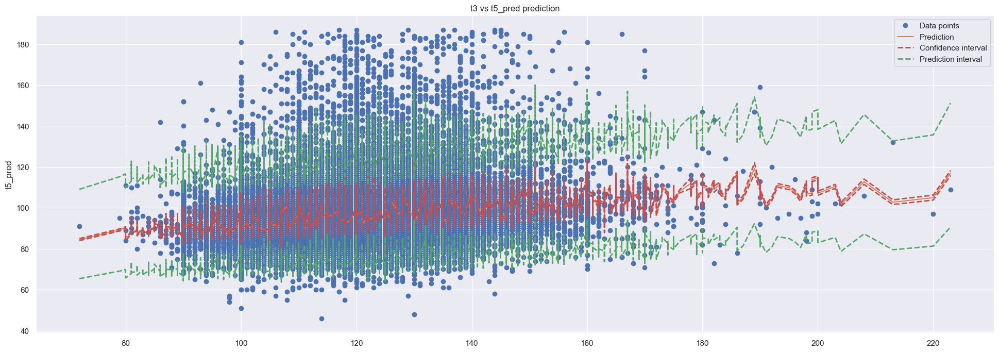

In [44]:
# TODO: wrap into the function

X_AXIS = "t3" # "t6" "t3" "tt7"
pred_name = TARGET + "_pred"

model_v2_stat = 10 ** (
    model_v2
    .get_prediction(df_clip_trans)
    .summary_frame(alpha=ALPHA))
model_v2_stat.rename({"mean": pred_name},
                          axis=1,
                          inplace=True)
model_v2_stat[X_AXIS] = (df_clip[X_AXIS]
                         .reset_index(drop=True))
model_v2_stat[TARGET] = (df_clip[TARGET]
                         .reset_index(drop=True))
model_v2_stat = (model_v2_stat
                 .sort_values(X_AXIS)
                 .reset_index(drop=True))
plot_pred_with_intervals(model_v2_stat,
                         X_AXIS,
                         pred_name,
                         true_col=TARGET)

* __Confidence intervals__ - how well population mean is determined. For alpha = 5% you can expect 95% of the intervals you calculate to capture the true population mean.
* __Prediction intervals__ - where you can expect the next data point sampled. Includes population mean and the values random variation.    

It is seen confidence interval is low, therefore the population mean could be determined well (the value of t5 in common case). But prediciton interval is big, which means a big random variation which cannot be described by such model.

Based on the graph it is possible to say that for specific feature value target value are going to have mean value in __confidence interval__ and it's value with random are in __prediction interval__. Depending of which results is required for regulation, could be used __confidence interval__, __prediction interval__ or __prediciton__ itself:
* __Confidence interval__ to show uncertainty for further decision-making based on another model or by human. For such cases it is better to use Bayesian models.
* __Prediction interval__ and __prediciton__ could be used for adjustment process itself and to show the influence of randomized/unknown processes/parameters.

#### Model usage based on plot information

Regulate based on the plot (based on syntetic data or as hereinbelow with Prediction interval estimation)

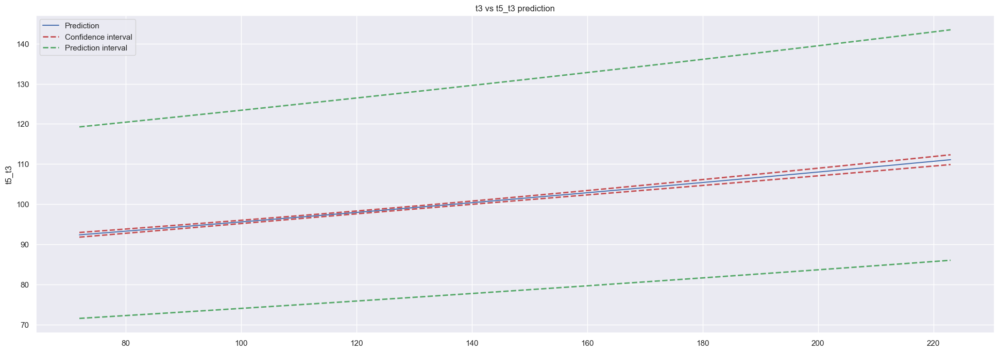

In [45]:
pred_name = TARGET + "_" + X_AXIS

plot_pred_with_intervals(df_ts_vs_features,
                         X_AXIS,
                         pred_name,
                         prefix = pred_name + "__",
                         true_col = None,
                         is_obs = True
                         )

#### Model usage based on equation resolving

In [46]:
var_name = X_AXIS # "t3", "t6" ...
args = df_clip_one_hot.iloc[ROW_EXAMPLE, :].to_dict()
var_true = args.pop(var_name)
x0 = df_clip_one_hot[var_name].median()

# f_model_v2.define_args(args)
# f_model_v2.solve([x0], ['t3'])

In [51]:
# TODO: round results if it is not acceptable due to adjustment, probably optimization task

f_model_v2.define_args(args)
solve_res = fsolve(func=f_model_v2.solve, x0=[x0], args=[var_name])[0]

print(f"Equation resolving result for {var_name} is:"
      f"\n{solve_res:.2f}"
      f"\nReal value is:"
      f"\n{var_true}")

# Check resolving correction
args_check = df_clip_one_hot.iloc[ROW_EXAMPLE, df_clip_one_hot.columns != var_name].to_dict()
args_check.update({var_name: solve_res})
assert round(f_model_v2(args_check), 2) == round(args_check[TARGET], 2)

# Do not forget for log transformation for some features
# TODO: create a class to transform features in both directions

df_eq_test = df_clip_trans.iloc[[ROW_EXAMPLE], :].copy()
df_eq_test[var_name] = solve_res
model_v2_eq = 10 ** (
    model_v2
    .get_prediction(df_eq_test)
    .summary_frame(alpha=ALPHA))

# Prediction interval also could be used to show that the target value 
# could fluctuated because of influence of other parameters or because of unknown processes
print(f"Setting f{var_name}={solve_res:.2f} mean value of {TARGET} "
      f"is equal to {round(model_v2_eq.loc[0, 'mean'], 2)} "
      f"with confidence interval "
      f"{round(model_v2_eq.loc[0, 'mean_ci_lower'], 2)}-"
      f"{round(model_v2_eq.loc[0, 'mean_ci_upper'], 2)}, "
      f"prediction interval is: "
      f"{round(model_v2_eq.loc[0, 'obs_ci_lower'], 2)}-"
      f"{round(model_v2_eq.loc[0, 'obs_ci_upper'], 2)} ")

Equation resolving result for t3 is:
152.50
Real value is:
120.0
Setting ft3=152.50 mean value of t5 is equal to 102.0 with confidence interval 101.51-102.49, prediction interval is: 78.99-131.71 


With the same approach it is possible to solve inverse problem: to predict features. it is more difficult for support and training, but it gives confidence intervals for features.

#### Model usage based on grid search

Let's imagine it is required to adjust several (e.g. 2) parameters to get desired tagret (t5). Because it is not obvious how to regulate them without additional constraints, the solutionion could be presented as a plot of regulation parameters

In [70]:
# NOTE: do not work for categorical feature
param_1_dependent = X_AXIS # "t3", "t6" ...
param_2_dependent = "t13"
param_eq = "t6" # "t10", "t7", "t11", "t13"
eq_res_name = param_eq + "_" + "pred"

points_to_calc = 100

# TODO: duplicated code
step = (df_clip_bounds[param_1_dependent]["max"] 
        - df_clip_bounds[param_1_dependent]["min"]) / (points_to_calc - 1)
param_1_range = np.arange(df_clip_bounds[param_1_dependent]["min"],
                    df_clip_bounds[param_1_dependent]["max"] + step,
                    step, )
step = (df_clip_bounds[param_2_dependent]["max"] 
        - df_clip_bounds[param_2_dependent]["min"]) / (points_to_calc - 1)
param_2_range = np.arange(df_clip_bounds[param_2_dependent]["min"],
                    df_clip_bounds[param_2_dependent]["max"] + step,
                    step)


args_list = []
args = df_clip_one_hot.iloc[
    ROW_EXAMPLE, 
    ~df_clip_one_hot.columns.isin([param_eq])].to_dict()
x0 = df_clip_one_hot[param_eq].quantile(0.75)

for val_1_dependent in param_1_range:
    for val_2_dependent in param_2_range:
        args_ = args.copy()
        args_[param_1_dependent] = val_1_dependent
        args_[param_2_dependent] = val_2_dependent
        
        f_model_v2.define_args(args_)
        args_[eq_res_name] = fsolve(func=f_model_v2.solve, x0=[x0], args=[param_eq])[0]
        
        args_list.append(args_)
        
df_params_eq_res = pd.DataFrame(args_list)

params_calc_len = df_params_eq_res.shape[0]
df_filter = (
    (df_params_eq_res[eq_res_name] >= df_clip_bounds[param_eq]["min"])
    & (df_params_eq_res[eq_res_name] <= df_clip_bounds[param_eq]["max"])
    )
df_params_eq_res_filtered = df_params_eq_res[df_filter]

print(f"Num of values {param_eq} in range "
      f"= {df_params_eq_res_filtered.shape[0]}/{df_params_eq_res.shape[0]}"
      f"\nAdjustment params: {param_1_dependent}, {param_2_dependent}, {param_eq}"
      f"\nTarget is {TARGET}={args[TARGET]}")

Num of values t6 in range = 3574/10000
Adjustment params: t3, t13, t6
Target is t5=102.0


Show results in 2D or 3D format

<Axes: xlabel='t3', ylabel='t13'>

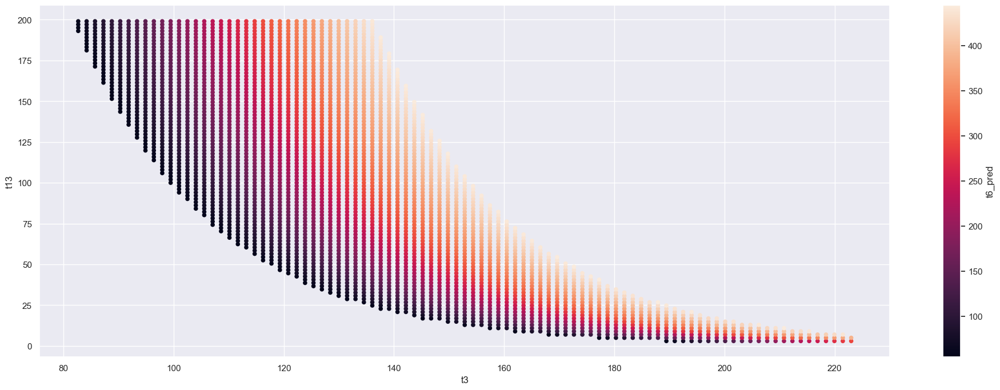

In [72]:
df_params_eq_res_filtered.plot.scatter(x=param_1_dependent, y=param_2_dependent, c=eq_res_name)

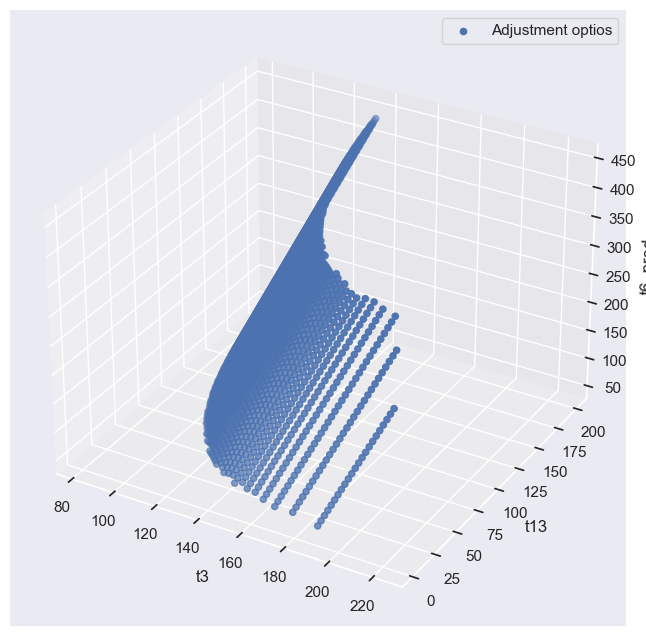

In [73]:
# %matplotlib notebook %matplotlib inline
ax = plt.figure(figsize=(FIGSIZE)).add_subplot(projection='3d')
ax.scatter(df_params_eq_res_filtered[param_1_dependent],
             df_params_eq_res_filtered[param_2_dependent],
             df_params_eq_res_filtered[eq_res_name],
             label="Adjustment optios")
ax.legend()
ax.set_xlabel(param_1_dependent)
ax.set_ylabel(param_2_dependent)
ax.set_zlabel(eq_res_name)
plt.show()

#### Some notes

When you adjust the process in most cases it's fluctuated. Current models are not consider it. It is required additional models and analysis of transition processes. 

# X. [DRAFT]Experimetns

It is not obvious what is the physical meaning of features therefore let's generate standart features

In [216]:
SEP_FEATURES = "_"
POWER_VALS = [2]
POWER_NAMES = ["2"]

Take the part of dataset without target and categorical features

In [254]:
df_clip_wo_t = df_clip_trans[df_clip_trans.columns[~df_clip_trans.columns.isin(CATEGORICAL_COLS + [TARGET, 't5', 't12', 't1', 't4'])]]
df_clip_wo_t.columns

Index(['t2', 't3', 't6', 't7', 't8', 't10', 't11', 't13'], dtype='object')

Create basic features

In [255]:
# TODO: wrap into function?

# Create paired features
dfs_clip_paired = []
excluded_cols = []
for col in df_clip_wo_t.columns[:-1]:
    col_filter = ~df_clip_wo_t.columns.isin(excluded_cols + [col])
    df_raw_paired = (df_clip_wo_t[df_clip_wo_t.columns[col_filter]]
                     .mul(df_clip_wo_t[col], axis=0))
    df_raw_paired.columns = df_raw_paired.columns + SEP_FEATURES + col
    dfs_clip_paired.append(df_raw_paired)
    excluded_cols.append(col)

# Create powered features
dfs_clip_powered = []
for pow, pow_name in zip(POWER_VALS, POWER_NAMES):
    df_clip_powered = df_clip_wo_t.pow(pow)
    df_clip_powered.columns = df_clip_powered.columns + SEP_FEATURES + pow_name
    dfs_clip_powered.append(df_clip_powered)

Combine features

In [260]:
df_clip_featured = pd.concat([dfs_clip_paired[0],
                              *dfs_clip_powered,
                              df_clip_wo_t,
                              df_clip_trans[[TARGET] + CATEGORICAL_COLS]], axis="columns")
# df_clip_featured = pd.concat([dfs_clip_paired[0], df_clip], axis="columns")
print(f"Features was {df_clip.shape[1] - 1}, now {df_clip_featured.shape[1]}")

Features was 12, now 25


Test model

In [261]:
str_features_generated = " + ".join(list(
    set(df_clip_featured.columns) - set(['t5'])
    ))

                            OLS Regression Results                            
Dep. Variable:                     t5   R-squared:                       0.126
Model:                            OLS   Adj. R-squared:                  0.126
Method:                 Least Squares   F-statistic:                     265.7
Date:                Mon, 15 Jan 2024   Prob (F-statistic):               0.00
Time:                        06:17:54   Log-Likelihood:                 75437.
No. Observations:               51593   AIC:                        -1.508e+05
Df Residuals:                   51564   BIC:                        -1.506e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.6176      0.038     42.614      0.0

C:\Users\parshin_sa2\AppData\Roaming\Python\Python310\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


LM Statistic        1.264664e+03
LM-Test p-value    1.020259e-248
F-Statistic         4.627550e+01
F-Test p-value     5.512336e-252
dtype: float64

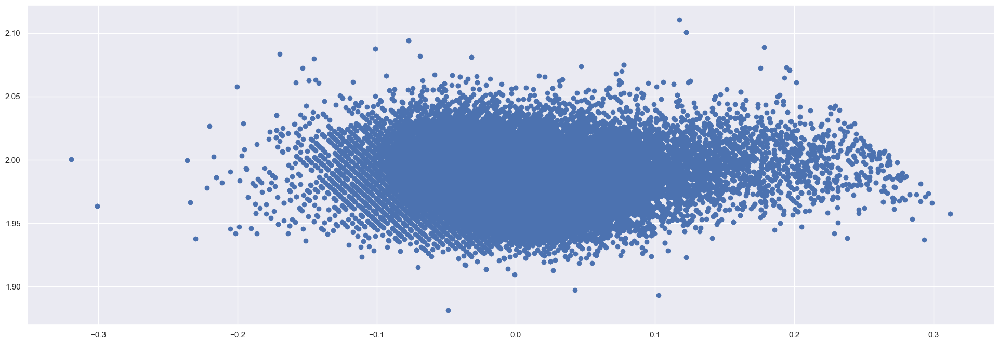

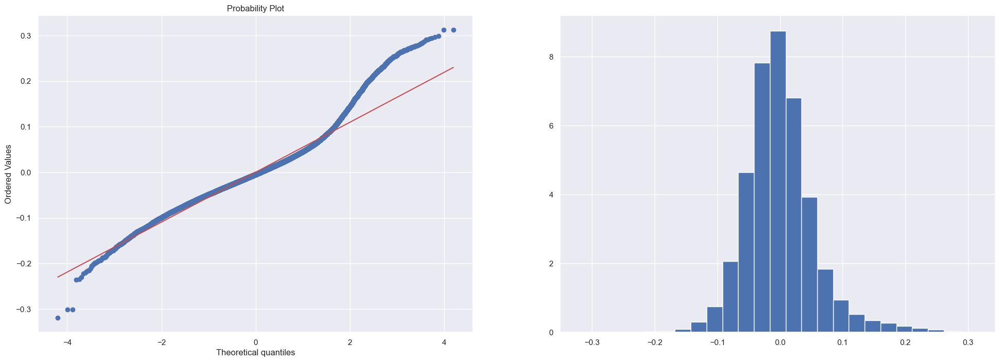

In [262]:
model_extensive, _, _ = create_explore_ols(df_clip_featured, TARGET, str_features_generated) # str_features_df_raw_vif_ str_features_df_raw_vif str_features_df_raw
print("Heteroskedasticity (Breusch-Pagan test)")
pd.Series(get_hetero_breusch_pagan(model_extensive.resid, model_extensive.model.exog))
# pd.Series(get_hetero_white_test(model_draft.resid, model_draft.model.exog))